<a href="https://colab.research.google.com/github/AlexandraLJones/FIRE-CloudComputing/blob/main/Ryan_FINAL_FIRE398_Convective_Cores.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#FIRE 398 Final Notebook 
##Investigating Convective Cores in Time and Space
###Ryan Moore, Alex Friedman, Eric Schneider, Ritvik Singh, Rohan Panickar
###April 24, 2021


#Introduction
Convective Cores are essential for creating convective heat and moisture transport. Analyzing how convective cores travel can lead to better forecasting since scientists would be able to predict where storms would lead to. Data contained in convective cores such as their sizes and depths can be analyzed in order to create more accurate weather models. 3D clustering with kmeans clustering of convective cores in time and space have been documented previous projects such as in a cloud system study (Stubenrauch). The implications of investigating convective cores with machine learning are endless. Perhaps in later studies, scientists could use models -- similarly to how we implemented our project -- to forecast supercells and other formations weeks before they truly form.

Our project aimed to answer the following question about convective cores: is there a fundamental temporal and/or spacial scale for convective updraft cores?
The team used an unsupervised machine learning approach and clustering to learn more about how convective cores move across time and space. Then we used a gaussian mixture model to cluster the data from the cores and classified the clusters to their respective cores. 

While there have been studies done that classify convective cores into the types of storms that are produced with machine learning (Jergensen), our project began using machine learning in order to classify convective cores according to their windspeeds. 


#Dependencies


In [ ]:
!pip install -q  netCDF4
!pip install sklearn
from netCDF4 import Dataset #Used to import the dataset
from google.colab import drive
import numpy as np #Used to store the dataset
import matplotlib.pyplot as plt #Used to plot the graphs
from sklearn.datasets.samples_generator import make_blobs #Used to make clusters
from sklearn.mixture import GaussianMixture #Used to make the GaussianMixtureModel
from sklearn.cluster import KMeans #Used to make the KMeansModel
drive.mount('/content/gdrive')
plt.figure(figsize=(10,8))

/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:144: FutureWarning: The sklearn.datasets.samples_generator module is  deprecated in version 0.22 and will be removed in version 0.24. The corresponding classes / functions should instead be imported from sklearn.datasets. Anything that cannot be imported from sklearn.datasets is now part of the private API.
  warnings.warn(message, FutureWarning)


Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).


<Figure size 720x576 with 0 Axes>

<Figure size 720x576 with 0 Axes>

#Data
The dataset we used was from NASA and provides a snapshot of a large assortment of convective cores at 12 different time intervals. The variables we used from the dataset were the Vertical Air Velocity (m/s) and the horizontal distance in the X/Y axis (km).

For the second objective we filtered the data to only have vertical air velocities of 3m/s or greater.

## Objective 1: Creating 2d Snapshots from CDF Files

This is a helper method we created to open the file and read it in. The method takes in the filename and returns the open file.

In [ ]:
def get_file(file):

  #list directory and file name
  DIRECTORY = "/content/gdrive/Shared drives/FIRE-CC/convective cores/test_data/" # path to the data directory
  FILE= file #name of one of the files, each file is a different snapshot in a time series
  #open as dataset
  file_path=DIRECTORY+FILE #concatenate the data directory and file name to make a complete path to the file
  fid = Dataset(file_path) #open the file for importing
  return fid
#Uploading the NASA data det into the collab notebook.

Reading in the 12 data sets we have for the vertical wind velocity so that we can define the variables and display them graphically.

In [ ]:
cdf1 = get_file("w_case_0_252.cdf")
cdf2 = get_file("w_case_0_253.cdf")
cdf3 = get_file("w_case_0_254.cdf")
cdf4 = get_file("w_case_0_255.cdf")
cdf5 = get_file("w_case_0_256.cdf")
cdf6 = get_file("w_case_0_257.cdf")
cdf7 = get_file("w_case_0_258.cdf")
cdf8 = get_file("w_case_0_259.cdf")
cdf9 = get_file("w_case_0_260.cdf")
cdf10 = get_file("w_case_0_261.cdf")
cdf11= get_file("w_case_0_262.cdf")
cdf12 = get_file("w_case_0_263.cdf")
#Importing each direct file and seperating the data. This allows for each specfic time set to be analyzed seperately.

In [ ]:
cdf1.variables
#This function imports the velocty and horizontal/vertical cross section variables needed for the project.

{'height': <class 'netCDF4._netCDF4.Variable'>
 float32 height(z)
     variable: height from the surface
     unit: km
 unlimited dimensions: 
 current shape = (43,)
 filling on, default _FillValue of 9.969209968386869e+36 used,
 'w': <class 'netCDF4._netCDF4.Variable'>
 float32 w(z, y, x)
     variable: vertical air velocity
     unit: m/s
 unlimited dimensions: 
 current shape = (43, 256, 256)
 filling on, default _FillValue of 9.969209968386869e+36 used,
 'xdir': <class 'netCDF4._netCDF4.Variable'>
 float32 xdir(x)
     variable: horizontal distance in x axis
     unit: km
 unlimited dimensions: 
 current shape = (256,)
 filling on, default _FillValue of 9.969209968386869e+36 used,
 'ydir': <class 'netCDF4._netCDF4.Variable'>
 float32 ydir(y)
     variable: horizontal distance in y axis
     unit: km
 unlimited dimensions: 
 current shape = (256,)
 filling on, default _FillValue of 9.969209968386869e+36 used}

These are two more helper methods we created to get the vertical wind velocity and to get the distance along the horizontal x direction.

In [ ]:
def get_w(file):
  w=file.variables['w'][:] # this is the vertical wind velocity itj has 3 dimensions. The leftmost dimension is height (z), the rightmost dimension is horizontal in the x direction. The units are meters per second.
  return w

def get_x(file):
  xdir=file.variables['xdir'][:] # this is the distance along the horizontal x direction it has 1 dimensions and units of km
  return xdir

def get_y(file):
  ydir=file.variables['ydir'][:] # this is the distance along the vertical y direction it has 1 dimensions and units of km
  return ydir

def get_z(file):
  height=file.variables['height'][:] # this is the distance along the vertical y direction it has 1 dimensions and units of km
  return height


Defines the variables for each cdf file (only reads in x position since value is the same for y)

In [ ]:
cdf1_w = get_w(cdf1) #method created to get the objects x, y, z position
cdf1_x = get_x(cdf1) #method to get horizontal (x) position
cdf1_y = get_y(cdf1) #method to get vertical (y) position
cdf1_z = get_z(cdf1) #method to get height (z) position



#We repeated these steps for each data set

cdf2_w = get_w(cdf2)
cdf2_x = get_x(cdf2)
cdf2_y = get_y(cdf2)
cdf2_z = get_z(cdf2)

cdf3_w = get_w(cdf3)
cdf3_x = get_x(cdf3)
cdf3_y = get_y(cdf3)
cdf3_z = get_z(cdf3)

cdf4_w = get_w(cdf4)
cdf4_x = get_x(cdf4)
cdf4_y = get_y(cdf4)
cdf4_z = get_z(cdf4)

cdf5_w = get_w(cdf5)
cdf5_x = get_x(cdf5)
cdf5_y = get_y(cdf5)
cdf5_z = get_z(cdf5)

cdf6_w = get_w(cdf6)
cdf6_x = get_x(cdf6)
cdf6_y = get_y(cdf6)
cdf6_z = get_z(cdf6)

cdf7_w = get_w(cdf7)
cdf7_x = get_x(cdf7)
cdf7_y = get_y(cdf7)
cdf7_z = get_z(cdf7)

cdf8_w = get_w(cdf8)
cdf8_x = get_x(cdf8)
cdf8_y = get_y(cdf8)
cdf8_z = get_z(cdf8)

cdf9_w = get_w(cdf9)
cdf9_x = get_x(cdf9)
cdf9_y = get_y(cdf9)
cdf9_z = get_z(cdf9)

cdf10_w = get_w(cdf10)
cdf10_x = get_x(cdf10)
cdf10_y = get_y(cdf10)
cdf10_z = get_z(cdf10)

cdf11_w = get_w(cdf11)
cdf11_x = get_x(cdf11)
cdf11_y = get_y(cdf11)
cdf11_z = get_z(cdf11)

cdf12_w = get_w(cdf12)
cdf12_x = get_x(cdf12)
cdf12_y = get_y(cdf12)
cdf12_z = get_z(cdf12)


###Begin Creating 2d Snapshots of CDF Files

Each graph maps the meshgrid of the horizontal cros section direction and vertical wind velocity with burgundy indicating a velocity over 3 m/s. We repeated the process for all CDF files and graphed their cross sections over time.

In [ ]:
horiz1, horiz2 = np.meshgrid(cdf1_x, cdf1_x) #meshgrid for x-y horizontal cross section

Text(0.5, 1.0, 'Core 1')

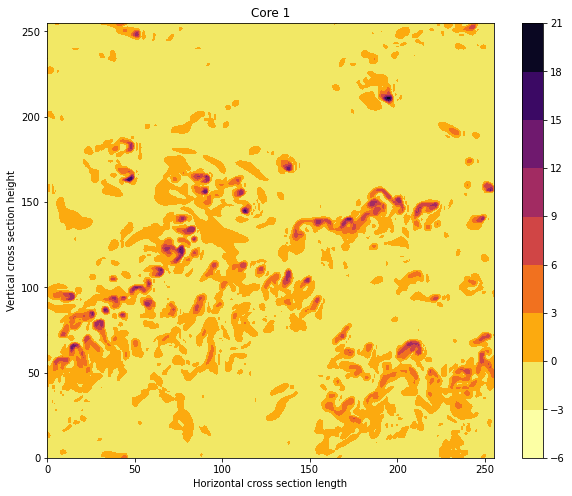

In [ ]:
plt.figure(figsize=(10,8))
plt.contourf(horiz1, horiz2, cdf1_w[18,:,:],vmin=-3, vmax=21, cmap='inferno_r')
#Creates a 2d plot meshgrid anaylzing the vertical velocity of each 1x1 pixel
plt.colorbar(orientation='vertical')
plt.xlabel('Horizontal cross section length')
plt.ylabel('Vertical cross section height')
#Adds labels to each graph
plt.title('Core 1')

Text(0.5, 1.0, 'Core 2')

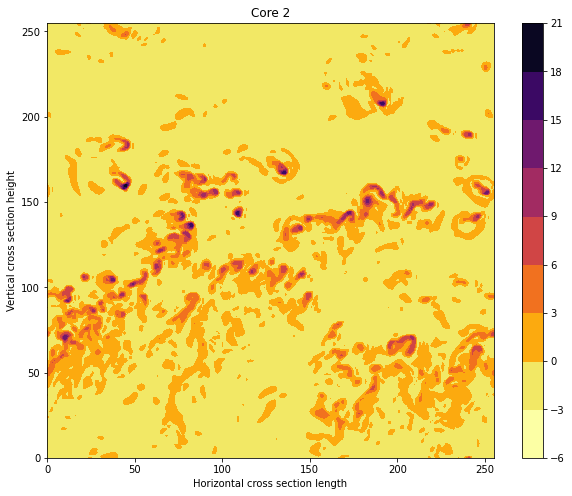

In [ ]:
#Repeats process for cdf2
horiz1_2, horiz2_2 = np.meshgrid(cdf2_x, cdf2_x) #meshgrid for x-y horizontal cross section
plt.figure(figsize=(10,8))
plt.contourf(horiz1_2, horiz2_2, cdf2_w[18,:,:],vmin=-3., vmax=21., cmap='inferno_r')
plt.colorbar(orientation='vertical')
plt.xlabel('Horizontal cross section length')
plt.ylabel('Vertical cross section height')
plt.title('Core 2')

Text(0.5, 1.0, 'Core 3')

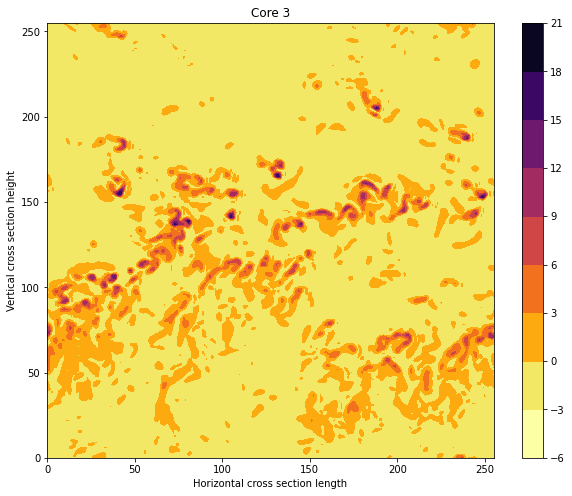

In [ ]:
horiz1_3, horiz2_3 = np.meshgrid(cdf3_x, cdf3_x) #meshgrid for x-y horizontal cross section
plt.figure(figsize=(10,8))
plt.contourf(horiz1_3, horiz2_3, cdf3_w[18,:,:],vmin=-3., vmax=21., cmap='inferno_r')
plt.colorbar(orientation='vertical')
plt.xlabel('Horizontal cross section length')
plt.ylabel('Vertical cross section height')
plt.title('Core 3')

Text(0.5, 1.0, 'Core 4')

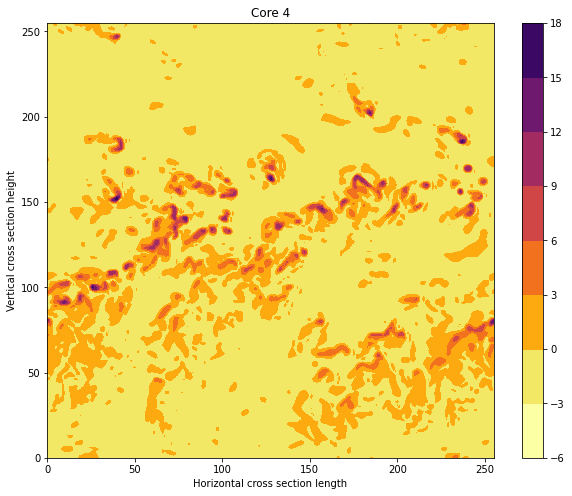

In [ ]:
horiz1_4, horiz2_4 = np.meshgrid(cdf4_x, cdf4_x) #meshgrid for x-y horizontal cross section
plt.figure(figsize=(10,8))
plt.contourf(horiz1_4, horiz2_4, cdf4_w[18,:,:],vmin=-3., vmax=21., cmap='inferno_r')
plt.colorbar(orientation='vertical')
plt.xlabel('Horizontal cross section length')
plt.ylabel('Vertical cross section height')
plt.title('Core 4')

Text(0.5, 1.0, 'Core 5')

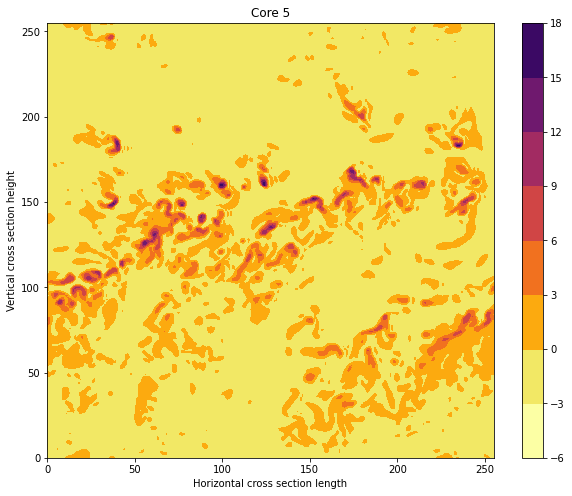

In [ ]:
horiz1_5, horiz2_5 = np.meshgrid(cdf5_x, cdf5_x) #meshgrid for x-y horizontal cross section
plt.figure(figsize=(10,8))
plt.contourf(horiz1_5, horiz2_5, cdf5_w[18,:,:],vmin=-3., vmax=21., cmap='inferno_r')
plt.colorbar(orientation='vertical')
plt.xlabel('Horizontal cross section length')
plt.ylabel('Vertical cross section height')
plt.title('Core 5')

Text(0.5, 1.0, 'Core 6')

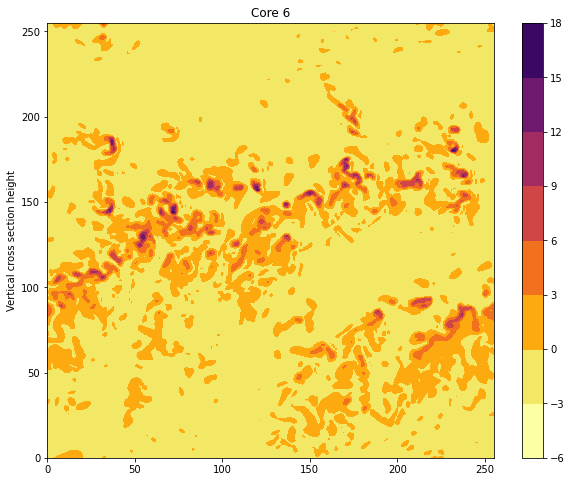

In [ ]:
horiz1_6, horiz2_6 = np.meshgrid(cdf6_x, cdf6_x) #meshgrid for x-y horizontal cross section
plt.figure(figsize=(10,8))
plt.contourf(horiz1_6, horiz2_6, cdf6_w[18,:,:],vmin=-3., vmax=21., cmap='inferno_r')
plt.colorbar(orientation='vertical')
plt.ylabel('Vertical cross section height')
plt.title('Core 6')

Text(0.5, 1.0, 'Core 7')

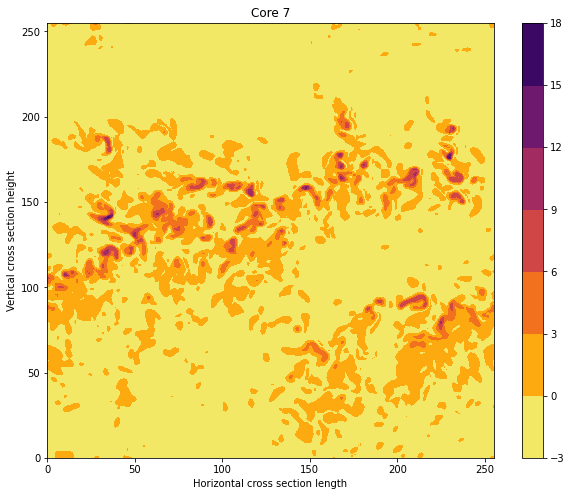

In [ ]:
horiz1_7, horiz2_7 = np.meshgrid(cdf7_x, cdf7_x) #meshgrid for x-y horizontal cross section
plt.figure(figsize=(10,8))
plt.contourf(horiz1_7, horiz2_7, cdf7_w[18,:,:],vmin=-3., vmax=21., cmap='inferno_r')
plt.colorbar(orientation='vertical')
plt.xlabel('Horizontal cross section length')
plt.ylabel('Vertical cross section height')
plt.title('Core 7')

Text(0.5, 1.0, 'Core 8')

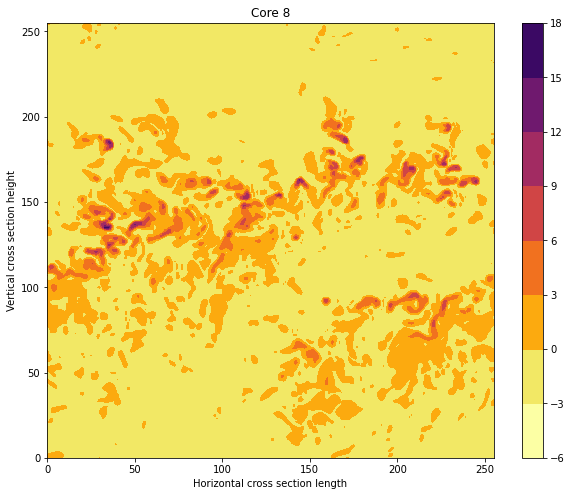

In [ ]:
horiz1_8, horiz2_8 = np.meshgrid(cdf8_x, cdf8_x) #meshgrid for x-y horizontal cross section
plt.figure(figsize=(10,8))
plt.contourf(horiz1_8, horiz2_8, cdf8_w[18,:,:],vmin=-3., vmax=21., cmap='inferno_r')
plt.colorbar(orientation='vertical')
plt.xlabel('Horizontal cross section length')
plt.ylabel('Vertical cross section height')
plt.title('Core 8')

Text(0.5, 1.0, 'Core 9')

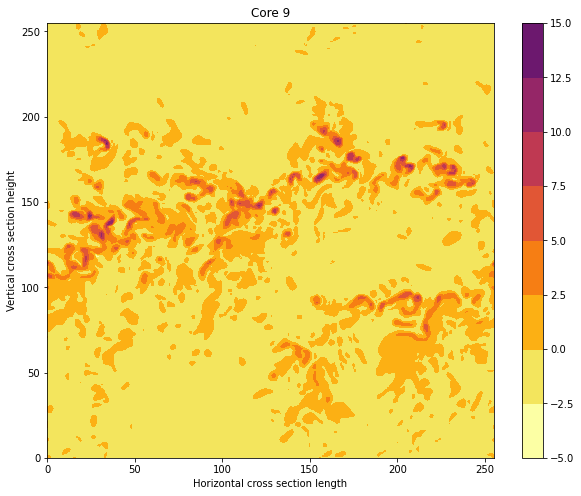

In [ ]:
horiz1_9, horiz2_9 = np.meshgrid(cdf9_x, cdf9_x) #meshgrid for x-y horizontal cross section
plt.figure(figsize=(10,8))
plt.contourf(horiz1_9, horiz2_9, cdf9_w[18,:,:],vmin=-3., vmax=21., cmap='inferno_r')
plt.colorbar(orientation='vertical')
plt.xlabel('Horizontal cross section length')
plt.ylabel('Vertical cross section height')
plt.title('Core 9')

Text(0.5, 1.0, 'Core 10')

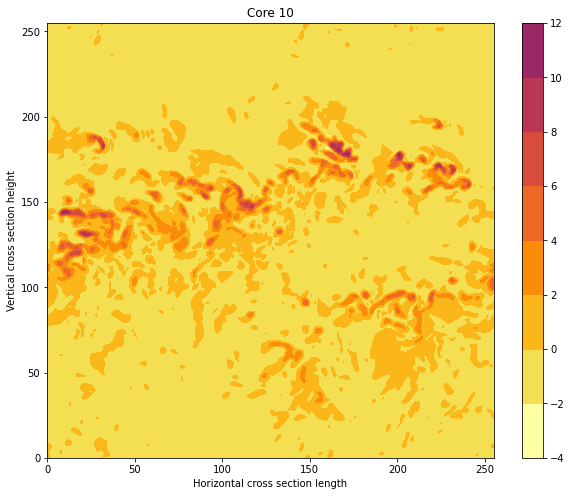

In [ ]:
horiz1_10, horiz2_10 = np.meshgrid(cdf10_x, cdf10_x) #meshgrid for x-y horizontal cross section
plt.figure(figsize=(10,8))
plt.contourf(horiz1_10, horiz2_10, cdf10_w[18,:,:],vmin=-3., vmax=21., cmap='inferno_r')
plt.colorbar(orientation='vertical')
plt.xlabel('Horizontal cross section length')
plt.ylabel('Vertical cross section height')
plt.title('Core 10')

Text(0.5, 1.0, 'Core 11')

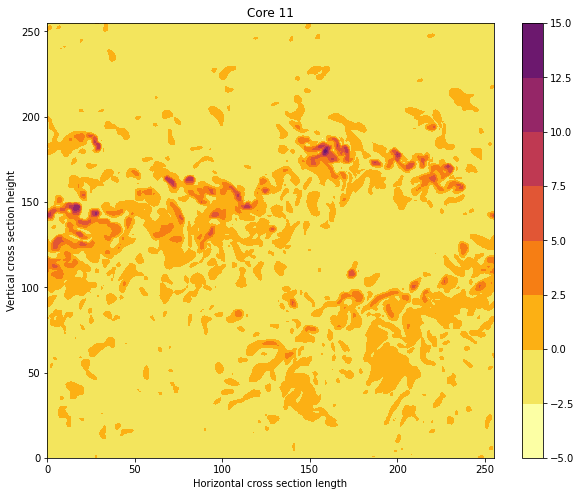

In [ ]:
horiz1_11, horiz2_11 = np.meshgrid(cdf11_x, cdf11_x) #meshgrid for x-y horizontal cross section
plt.figure(figsize=(10,8))
plt.contourf(horiz1_11, horiz2_11, cdf11_w[18,:,:],vmin=-3., vmax=21., cmap='inferno_r')
plt.colorbar(orientation='vertical', )
plt.xlabel('Horizontal cross section length')
plt.ylabel('Vertical cross section height')
plt.title('Core 11')

Text(0.5, 1.0, 'Core 12')

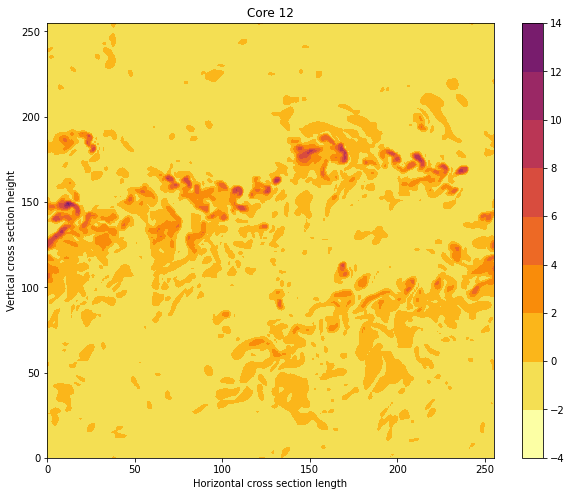

In [ ]:
horiz1_12, horiz2_12 = np.meshgrid(cdf12_x, cdf12_x) #meshgrid for x-y horizontal cross section
plt.figure(figsize=(10,8))
plt.contourf(horiz1_12, horiz2_12, cdf12_w[18,:,:],vmin=-3., vmax=21., cmap='inferno_r')
plt.colorbar(orientation='vertical')
plt.xlabel('Horizontal cross section length')
plt.ylabel('Vertical cross section height')
plt.title('Core 12')

The 2D graphs allow us to visualize the wind speed at a certain hieght and time in the core. The overall graph is a slice out of the core at 12 specfic times and each pixel represents the wind speed at a particular point of the cluster. We can use these graphs to check our clusters since our visualizations allow us to have a clear picture of average wind speeds in each core. 

##Objective 2: Visualizing 3D Convective Cores Using MatPlotLib

In this next objective, we will focus on displaying the convective cores in a 3 dimensional way while displaying the 4th dimension (vertical wind velocity) using a colormap. First, we will create a meshgrid and customize our figure. Next, we will create a copy of the numpy array and change the values in order to display the size of each point based on its significance. Lastly, we plot the figure and its colormap

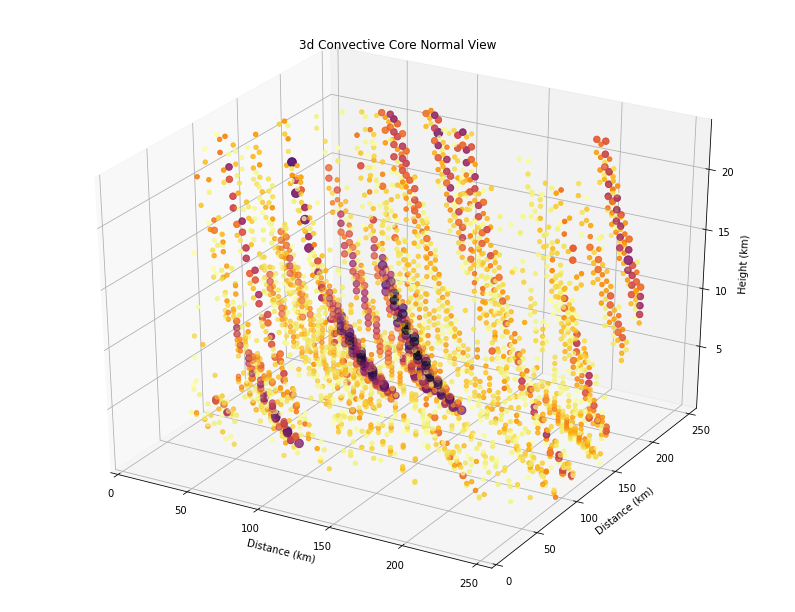

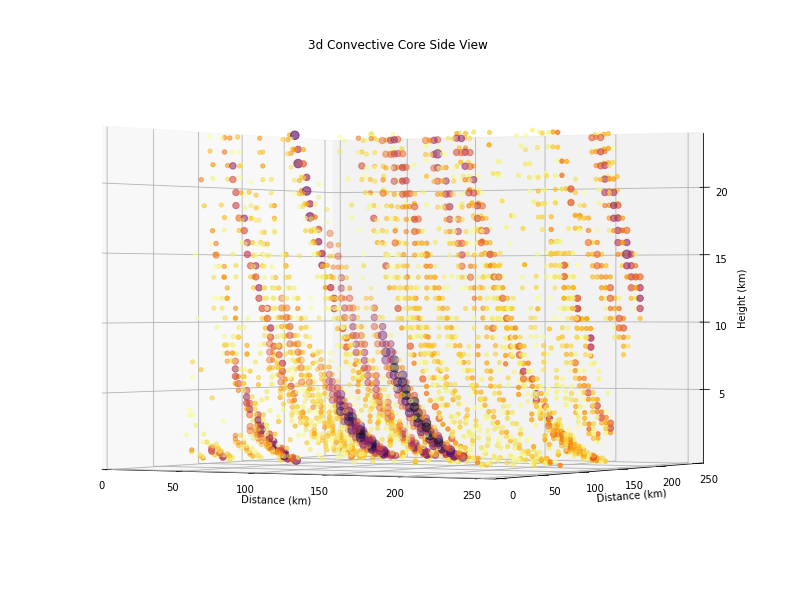

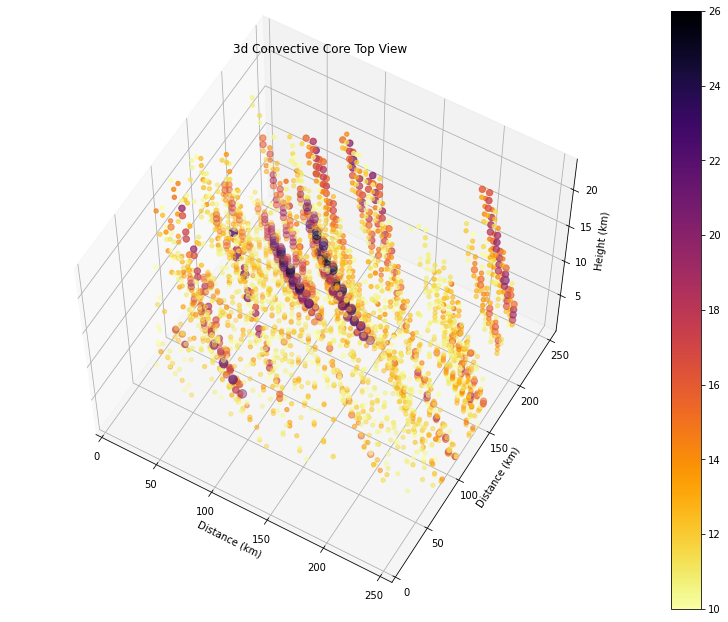

In [ ]:
#meshgrid for x-y-z 3D graph
x3d, y3d, z3d = np.meshgrid(cdf1_x, cdf1_y, cdf1_z) 

#Used work from team Mammatus
from mpl_toolkits.mplot3d import Axes3D

#Creates normal view graph
fig = plt.figure(figsize=(14,11))
ax = fig.add_subplot(111, projection='3d')
ax.set_title('3d Convective Core Normal View')
ax.set_xlim(cdf1_x[0],cdf1_x[-1])
ax.set_ylim(cdf1_y[0],cdf1_y[-1])
ax.set_zlim(cdf1_z[0],cdf1_z[-1])
ax.set_xlabel('Distance (km)')
ax.set_ylabel('Distance (km)')
ax.set_zlabel('Height (km)')

#Creates Side View Graph
fig = plt.figure(figsize=(14,11))
ax2 = fig.add_subplot(111, projection='3d')
ax2.set_title('3d Convective Core Side View')
ax2.set_xlim(cdf1_x[0],cdf1_x[-1])
ax2.set_ylim(cdf1_y[0],cdf1_y[-1])
ax2.set_zlim(cdf1_z[0],cdf1_z[-1])
ax2.set_xlabel('Distance (km)')
ax2.set_ylabel('Distance (km)')
ax2.set_zlabel('Height (km)')

#Creates Top View Graph
fig = plt.figure(figsize=(14,11))
ax3 = fig.add_subplot(111, projection='3d')
ax3.set_title('3d Convective Core Top View')
ax3.set_xlim(cdf1_x[0],cdf1_x[-1])
ax3.set_ylim(cdf1_y[0],cdf1_y[-1])
ax3.set_zlim(cdf1_z[0],cdf1_z[-1])
ax3.set_xlabel('Distance (km)')
ax3.set_ylabel('Distance (km)')
ax3.set_zlabel('Height (km)')

#Creates array for size of points
alphaVals = np.copy(cdf1_w)
alphaVals[alphaVals<10]=0
alphaVals_copy=alphaVals[alphaVals>10]
for x in alphaVals_copy:
  if x>10 and x<=15:
    alphaVals[alphaVals==x]=(abs(((x)/16)*10)+10)

  if x>15 and x<=20:
    alphaVals[alphaVals==x]=(abs(((x)/16)*10)+30)

  if x>20:
    alphaVals[alphaVals==x]=(abs(((x)/16)*10)+60)


#Sets view and plots normal view graph
ax.azim = -60
ax.dist = 10
ax.elev = 30
ax.scatter(x3d, y3d, z3d, c= cdf1_w[:,:,:],s=alphaVals, vmin=10, vmax=26, cmap='inferno_r')

#Sets view and plots side view graph
ax2.azim = -60
ax2.dist = 10
ax2.elev = 0
ax2.scatter(x3d, y3d, z3d, c= cdf1_w[:,:,:],s=alphaVals, vmin=10, vmax=26, cmap='inferno_r')

#Sets view and plots top view graph
ax3.azim = -60
ax3.dist = 10
ax3.elev = 60
ax3.scatter(x3d, y3d, z3d, c= cdf1_w[:,:,:],s=alphaVals, vmin=10, vmax=26, cmap='inferno_r')

#Plots colorbar and figures
p = ax.scatter(x3d, y3d, z3d, c = cdf1_w[:,:,:], s=alphaVals, vmin=10, vmax=26, cmap='inferno_r')

fig.colorbar(p)
fig.show()


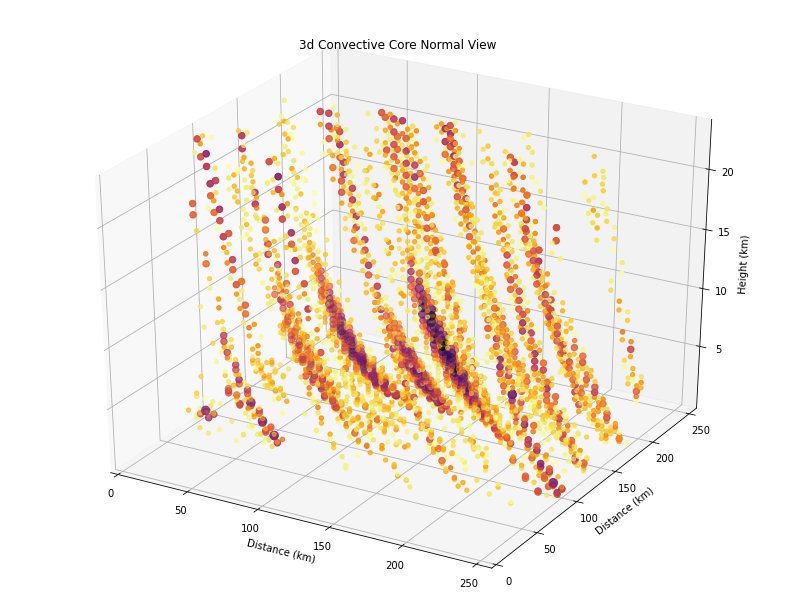

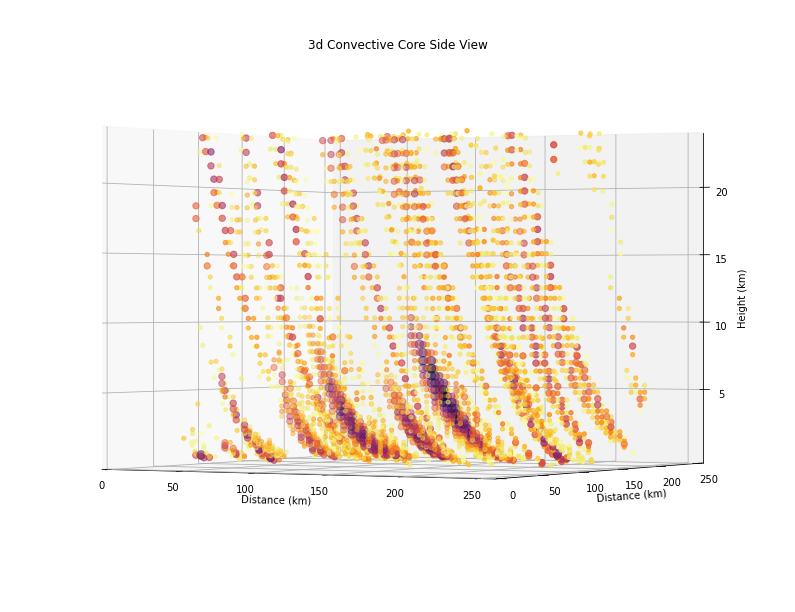

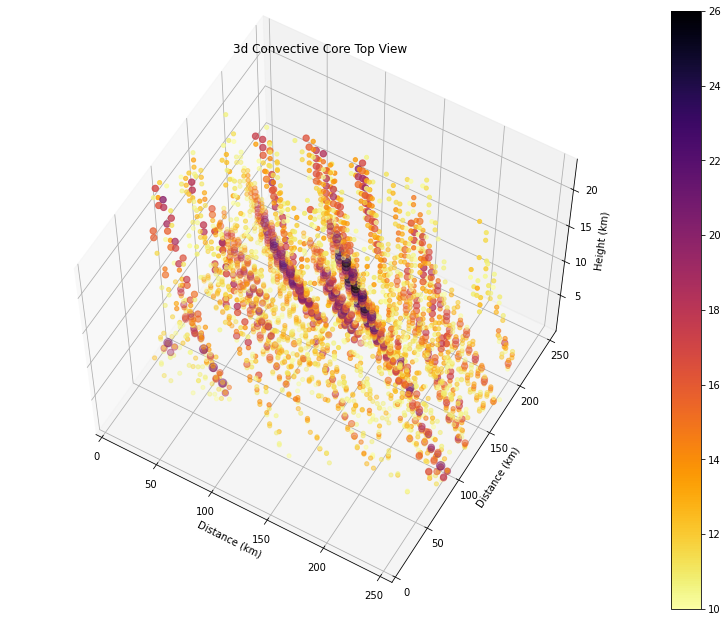

In [ ]:
#meshgrid for x-y-z 3D graph
x3d, y3d, z3d = np.meshgrid(cdf2_x, cdf2_y, cdf2_z) 

#Used work from team Mammatus
from mpl_toolkits.mplot3d import Axes3D

#Creates normal view graph
fig = plt.figure(figsize=(14,11))
ax = fig.add_subplot(111, projection='3d')
ax.set_title('3d Convective Core Normal View')
ax.set_xlim(cdf2_x[0],cdf2_x[-1])
ax.set_ylim(cdf2_y[0],cdf2_y[-1])
ax.set_zlim(cdf2_z[0],cdf2_z[-1])
ax.set_xlabel('Distance (km)')
ax.set_ylabel('Distance (km)')
ax.set_zlabel('Height (km)')

#Creates Side View Graph
fig = plt.figure(figsize=(14,11))
ax2 = fig.add_subplot(111, projection='3d')
ax2.set_title('3d Convective Core Side View')
ax2.set_xlim(cdf2_x[0],cdf2_x[-1])
ax2.set_ylim(cdf2_y[0],cdf2_y[-1])
ax2.set_zlim(cdf2_z[0],cdf2_z[-1])
ax2.set_xlabel('Distance (km)')
ax2.set_ylabel('Distance (km)')
ax2.set_zlabel('Height (km)')

#Creates Top View Graph
fig = plt.figure(figsize=(14,11))
ax3 = fig.add_subplot(111, projection='3d')
ax3.set_title('3d Convective Core Top View')
ax3.set_xlim(cdf2_x[0],cdf2_x[-1])
ax3.set_ylim(cdf2_y[0],cdf2_y[-1])
ax3.set_zlim(cdf2_z[0],cdf2_z[-1])
ax3.set_xlabel('Distance (km)')
ax3.set_ylabel('Distance (km)')
ax3.set_zlabel('Height (km)')

#Creates array for size of points
alphaVals = np.copy(cdf2_w)
alphaVals[alphaVals<10]=0
alphaVals_copy=alphaVals[alphaVals>10]
for x in alphaVals_copy:
  if x>10 and x<=15:
    alphaVals[alphaVals==x]=(abs(((x)/16)*10)+10)

  if x>15 and x<=20:
    alphaVals[alphaVals==x]=(abs(((x)/16)*10)+30)

  if x>20:
    alphaVals[alphaVals==x]=(abs(((x)/16)*10)+60)


#Sets view and plots normal view graph
ax.azim = -60
ax.dist = 10
ax.elev = 30
ax.scatter(x3d, y3d, z3d, c= cdf2_w[:,:,:],s=alphaVals, vmin=10, vmax=26, cmap='inferno_r')

#Sets view and plots side view graph
ax2.azim = -60
ax2.dist = 10
ax2.elev = 0
ax2.scatter(x3d, y3d, z3d, c= cdf2_w[:,:,:],s=alphaVals, vmin=10, vmax=26, cmap='inferno_r')

#Sets view and plots top view graph
ax3.azim = -60
ax3.dist = 10
ax3.elev = 60
ax3.scatter(x3d, y3d, z3d, c= cdf2_w[:,:,:],s=alphaVals, vmin=10, vmax=26, cmap='inferno_r')

#Plots colorbar and figures
p = ax.scatter(x3d, y3d, z3d, c = cdf2_w[:,:,:], s=alphaVals, vmin=10, vmax=26, cmap='inferno_r')

fig.colorbar(p)
fig.show()


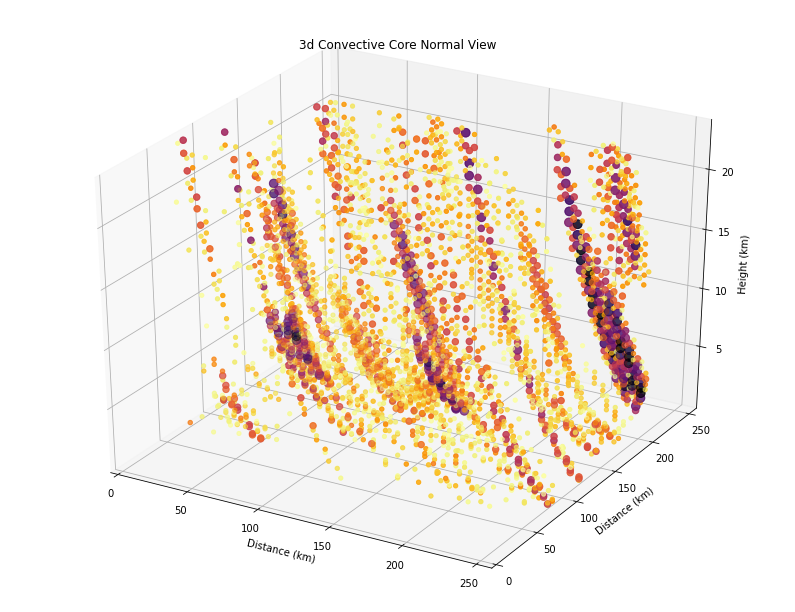

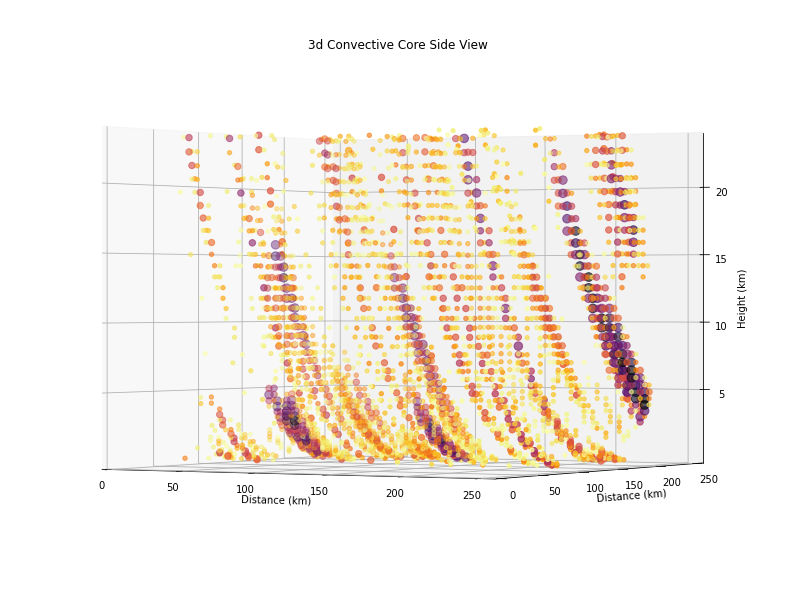

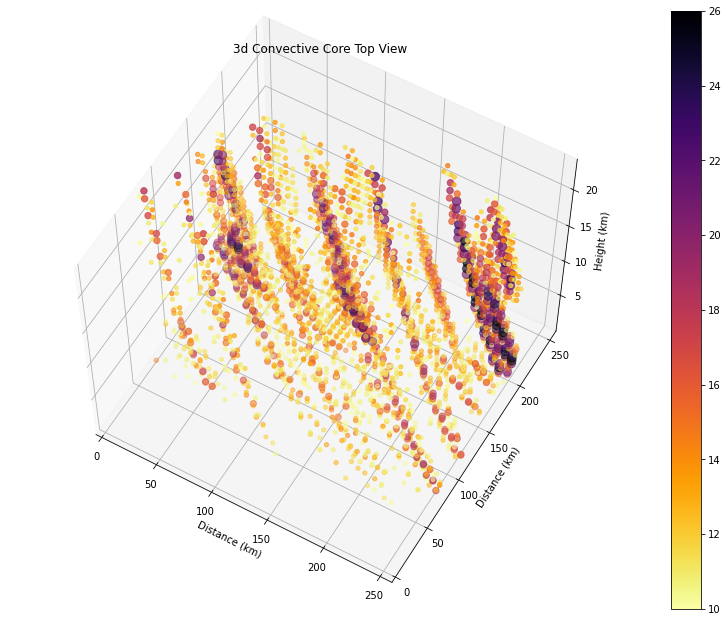

In [ ]:
#meshgrid for x-y-z 3D graph
x3d, y3d, z3d = np.meshgrid(cdf3_x, cdf3_y, cdf3_z) 

#Used work from team Mammatus
from mpl_toolkits.mplot3d import Axes3D

#Creates normal view graph
fig = plt.figure(figsize=(14,11))
ax = fig.add_subplot(111, projection='3d')
ax.set_title('3d Convective Core Normal View')
ax.set_xlim(cdf3_x[0],cdf3_x[-1])
ax.set_ylim(cdf3_y[0],cdf3_y[-1])
ax.set_zlim(cdf3_z[0],cdf3_z[-1])
ax.set_xlabel('Distance (km)')
ax.set_ylabel('Distance (km)')
ax.set_zlabel('Height (km)')

#Creates Side View Graph
fig = plt.figure(figsize=(14,11))
ax2 = fig.add_subplot(111, projection='3d')
ax2.set_title('3d Convective Core Side View')
ax2.set_xlim(cdf3_x[0],cdf3_x[-1])
ax2.set_ylim(cdf3_y[0],cdf3_y[-1])
ax2.set_zlim(cdf3_z[0],cdf3_z[-1])
ax2.set_xlabel('Distance (km)')
ax2.set_ylabel('Distance (km)')
ax2.set_zlabel('Height (km)')

#Creates Top View Graph
fig = plt.figure(figsize=(14,11))
ax3 = fig.add_subplot(111, projection='3d')
ax3.set_title('3d Convective Core Top View')
ax3.set_xlim(cdf3_x[0],cdf3_x[-1])
ax3.set_ylim(cdf3_y[0],cdf3_y[-1])
ax3.set_zlim(cdf3_z[0],cdf3_z[-1])
ax3.set_xlabel('Distance (km)')
ax3.set_ylabel('Distance (km)')
ax3.set_zlabel('Height (km)')

#Creates array for size of points
alphaVals = np.copy(cdf3_w)
alphaVals[alphaVals<10]=0
alphaVals_copy=alphaVals[alphaVals>10]
for x in alphaVals_copy:
  if x>10 and x<=15:
    alphaVals[alphaVals==x]=(abs(((x)/16)*10)+10)

  if x>15 and x<=20:
    alphaVals[alphaVals==x]=(abs(((x)/16)*10)+30)

  if x>20:
    alphaVals[alphaVals==x]=(abs(((x)/16)*10)+60)


#Sets view and plots normal view graph
ax.azim = -60
ax.dist = 10
ax.elev = 30
ax.scatter(x3d, y3d, z3d, c= cdf3_w[:,:,:],s=alphaVals, vmin=10, vmax=26, cmap='inferno_r')

#Sets view and plots side view graph
ax2.azim = -60
ax2.dist = 10
ax2.elev = 0
ax2.scatter(x3d, y3d, z3d, c= cdf3_w[:,:,:],s=alphaVals, vmin=10, vmax=26, cmap='inferno_r')

#Sets view and plots top view graph
ax3.azim = -60
ax3.dist = 10
ax3.elev = 60
ax3.scatter(x3d, y3d, z3d, c= cdf3_w[:,:,:],s=alphaVals, vmin=10, vmax=26, cmap='inferno_r')

#Plots colorbar and figures
p = ax.scatter(x3d, y3d, z3d, c = cdf3_w[:,:,:], s=alphaVals, vmin=10, vmax=26, cmap='inferno_r')

fig.colorbar(p)
fig.show()


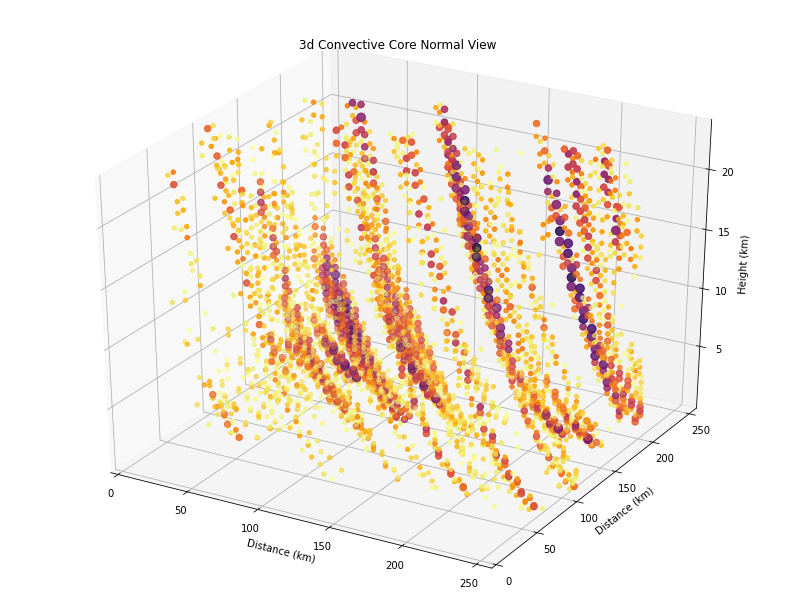

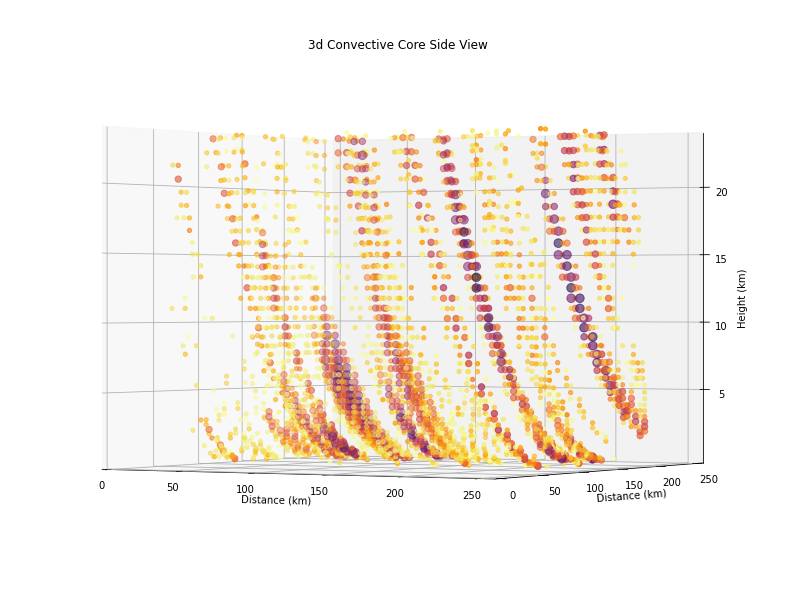

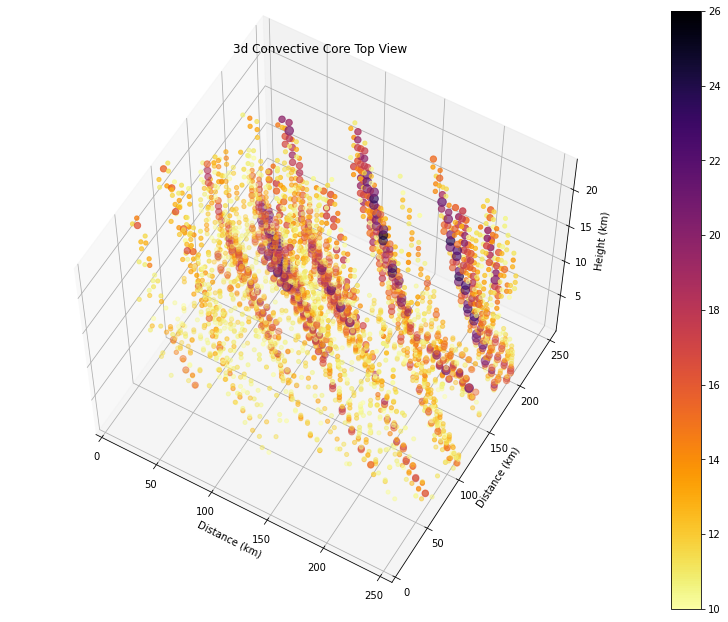

In [ ]:
#meshgrid for x-y-z 3D graph
x3d, y3d, z3d = np.meshgrid(cdf4_x, cdf4_y, cdf4_z) 

#Used work from team Mammatus
from mpl_toolkits.mplot3d import Axes3D

#Creates normal view graph
fig = plt.figure(figsize=(14,11))
ax = fig.add_subplot(111, projection='3d')
ax.set_title('3d Convective Core Normal View')
ax.set_xlim(cdf4_x[0],cdf4_x[-1])
ax.set_ylim(cdf4_y[0],cdf4_y[-1])
ax.set_zlim(cdf4_z[0],cdf4_z[-1])
ax.set_xlabel('Distance (km)')
ax.set_ylabel('Distance (km)')
ax.set_zlabel('Height (km)')

#Creates Side View Graph
fig = plt.figure(figsize=(14,11))
ax2 = fig.add_subplot(111, projection='3d')
ax2.set_title('3d Convective Core Side View')
ax2.set_xlim(cdf4_x[0],cdf4_x[-1])
ax2.set_ylim(cdf4_y[0],cdf4_y[-1])
ax2.set_zlim(cdf4_z[0],cdf4_z[-1])
ax2.set_xlabel('Distance (km)')
ax2.set_ylabel('Distance (km)')
ax2.set_zlabel('Height (km)')

#Creates Top View Graph
fig = plt.figure(figsize=(14,11))
ax3 = fig.add_subplot(111, projection='3d')
ax3.set_title('3d Convective Core Top View')
ax3.set_xlim(cdf4_x[0],cdf4_x[-1])
ax3.set_ylim(cdf4_y[0],cdf4_y[-1])
ax3.set_zlim(cdf4_z[0],cdf4_z[-1])
ax3.set_xlabel('Distance (km)')
ax3.set_ylabel('Distance (km)')
ax3.set_zlabel('Height (km)')

#Creates array for size of points
alphaVals = np.copy(cdf4_w)
alphaVals[alphaVals<10]=0
alphaVals_copy=alphaVals[alphaVals>10]
for x in alphaVals_copy:
  if x>10 and x<=15:
    alphaVals[alphaVals==x]=(abs(((x)/16)*10)+10)

  if x>15 and x<=20:
    alphaVals[alphaVals==x]=(abs(((x)/16)*10)+30)

  if x>20:
    alphaVals[alphaVals==x]=(abs(((x)/16)*10)+60)


#Sets view and plots normal view graph
ax.azim = -60
ax.dist = 10
ax.elev = 30
ax.scatter(x3d, y3d, z3d, c= cdf4_w[:,:,:],s=alphaVals, vmin=10, vmax=26, cmap='inferno_r')

#Sets view and plots side view graph
ax2.azim = -60
ax2.dist = 10
ax2.elev = 0
ax2.scatter(x3d, y3d, z3d, c= cdf4_w[:,:,:],s=alphaVals, vmin=10, vmax=26, cmap='inferno_r')

#Sets view and plots top view graph
ax3.azim = -60
ax3.dist = 10
ax3.elev = 60
ax3.scatter(x3d, y3d, z3d, c= cdf4_w[:,:,:],s=alphaVals, vmin=10, vmax=26, cmap='inferno_r')

#Plots colorbar and figures
p = ax.scatter(x3d, y3d, z3d, c = cdf4_w[:,:,:], s=alphaVals, vmin=10, vmax=26, cmap='inferno_r')

fig.colorbar(p)
fig.show()


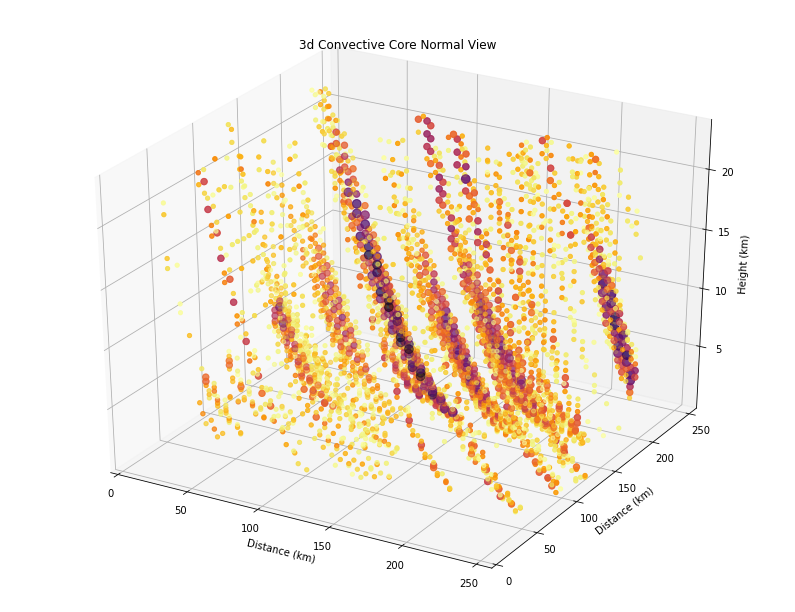

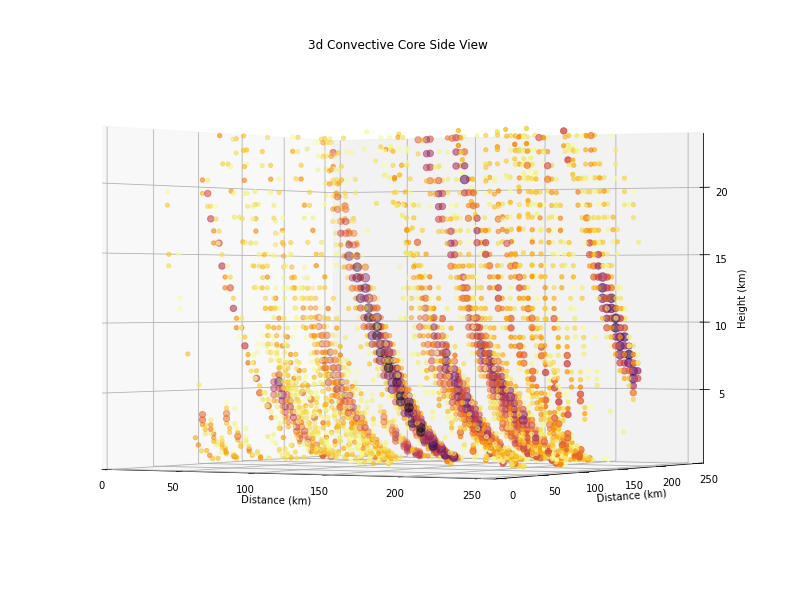

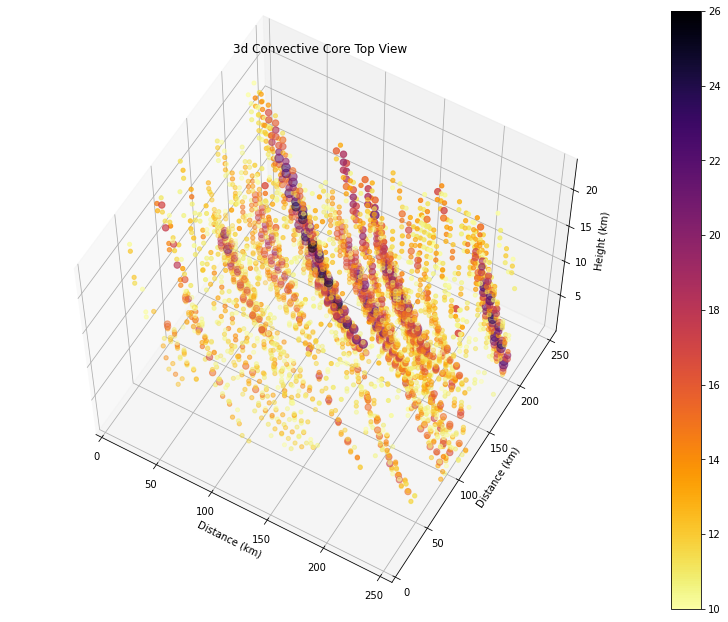

In [ ]:
#meshgrid for x-y-z 3D graph
x3d, y3d, z3d = np.meshgrid(cdf5_x, cdf5_y, cdf5_z) 

#Used work from team Mammatus
from mpl_toolkits.mplot3d import Axes3D

#Creates normal view graph
fig = plt.figure(figsize=(14,11))
ax = fig.add_subplot(111, projection='3d')
ax.set_title('3d Convective Core Normal View')
ax.set_xlim(cdf5_x[0],cdf5_x[-1])
ax.set_ylim(cdf5_y[0],cdf5_y[-1])
ax.set_zlim(cdf5_z[0],cdf5_z[-1])
ax.set_xlabel('Distance (km)')
ax.set_ylabel('Distance (km)')
ax.set_zlabel('Height (km)')

#Creates Side View Graph
fig = plt.figure(figsize=(14,11))
ax2 = fig.add_subplot(111, projection='3d')
ax2.set_title('3d Convective Core Side View')
ax2.set_xlim(cdf5_x[0],cdf5_x[-1])
ax2.set_ylim(cdf5_y[0],cdf5_y[-1])
ax2.set_zlim(cdf5_z[0],cdf5_z[-1])
ax2.set_xlabel('Distance (km)')
ax2.set_ylabel('Distance (km)')
ax2.set_zlabel('Height (km)')

#Creates Top View Graph
fig = plt.figure(figsize=(14,11))
ax3 = fig.add_subplot(111, projection='3d')
ax3.set_title('3d Convective Core Top View')
ax3.set_xlim(cdf5_x[0],cdf5_x[-1])
ax3.set_ylim(cdf5_y[0],cdf5_y[-1])
ax3.set_zlim(cdf5_z[0],cdf5_z[-1])
ax3.set_xlabel('Distance (km)')
ax3.set_ylabel('Distance (km)')
ax3.set_zlabel('Height (km)')

#Creates array for size of points
alphaVals = np.copy(cdf5_w)
alphaVals[alphaVals<10]=0
alphaVals_copy=alphaVals[alphaVals>10]
for x in alphaVals_copy:
  if x>10 and x<=15:
    alphaVals[alphaVals==x]=(abs(((x)/16)*10)+10)

  if x>15 and x<=20:
    alphaVals[alphaVals==x]=(abs(((x)/16)*10)+30)

  if x>20:
    alphaVals[alphaVals==x]=(abs(((x)/16)*10)+60)


#Sets view and plots normal view graph
ax.azim = -60
ax.dist = 10
ax.elev = 30
ax.scatter(x3d, y3d, z3d, c= cdf5_w[:,:,:],s=alphaVals, vmin=10, vmax=26, cmap='inferno_r')

#Sets view and plots side view graph
ax2.azim = -60
ax2.dist = 10
ax2.elev = 0
ax2.scatter(x3d, y3d, z3d, c= cdf5_w[:,:,:],s=alphaVals, vmin=10, vmax=26, cmap='inferno_r')

#Sets view and plots top view graph
ax3.azim = -60
ax3.dist = 10
ax3.elev = 60
ax3.scatter(x3d, y3d, z3d, c= cdf5_w[:,:,:],s=alphaVals, vmin=10, vmax=26, cmap='inferno_r')

#Plots colorbar and figures
p = ax.scatter(x3d, y3d, z3d, c = cdf5_w[:,:,:], s=alphaVals, vmin=10, vmax=26, cmap='inferno_r')

fig.colorbar(p)
fig.show()


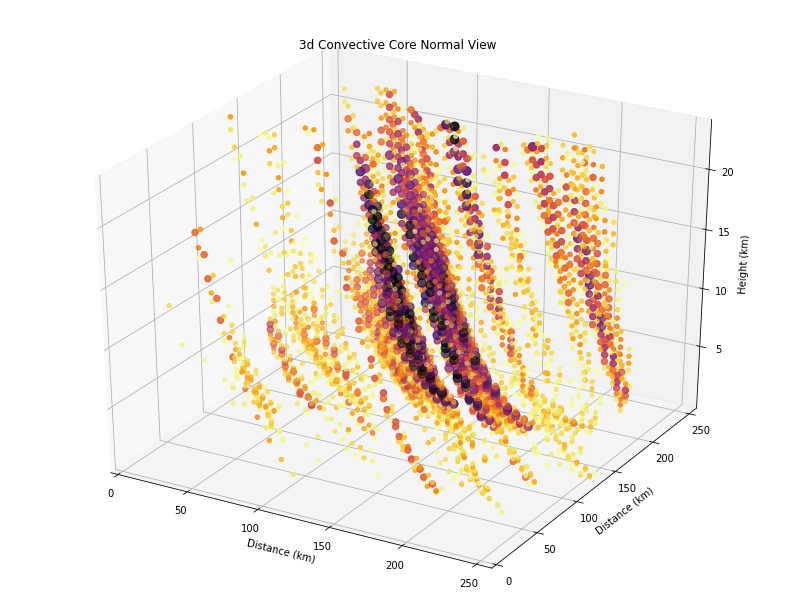

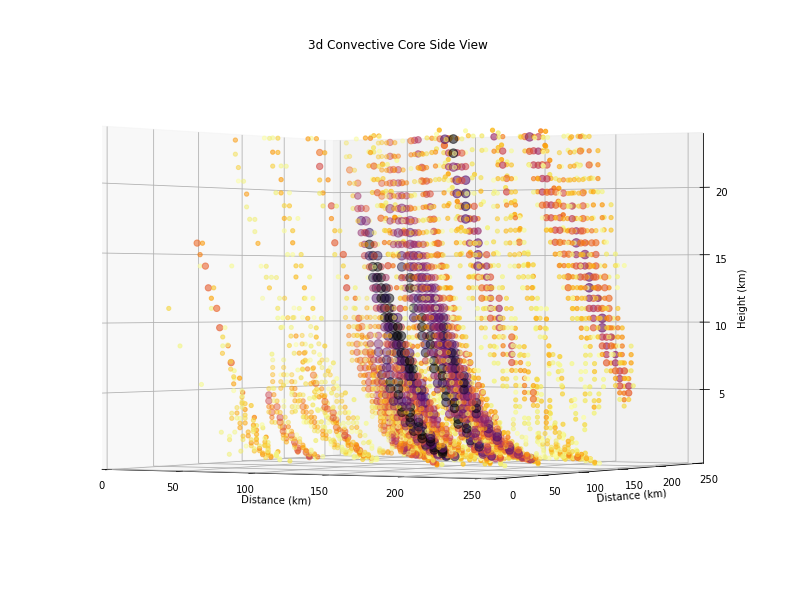

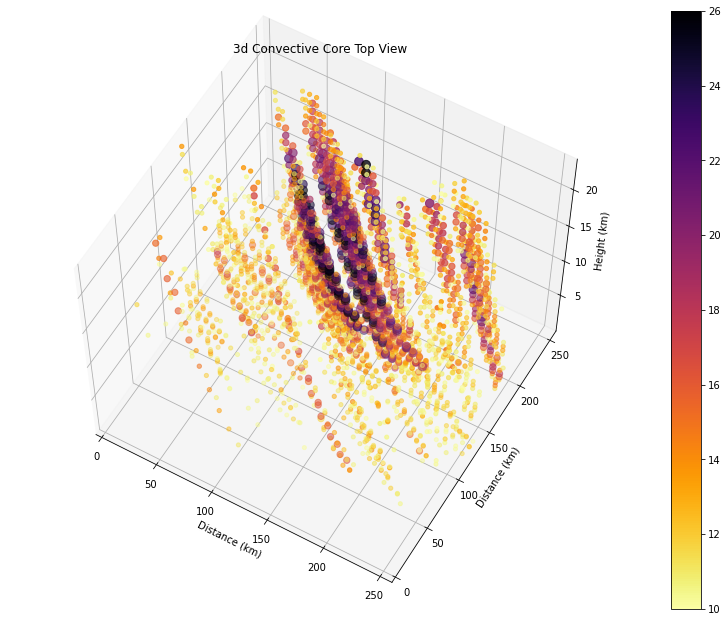

In [ ]:
#meshgrid for x-y-z 3D graph
x3d, y3d, z3d = np.meshgrid(cdf6_x, cdf6_y, cdf6_z) 

#Used work from team Mammatus
from mpl_toolkits.mplot3d import Axes3D

#Creates normal view graph
fig = plt.figure(figsize=(14,11))
ax = fig.add_subplot(111, projection='3d')
ax.set_title('3d Convective Core Normal View')
ax.set_xlim(cdf6_x[0],cdf6_x[-1])
ax.set_ylim(cdf6_y[0],cdf6_y[-1])
ax.set_zlim(cdf6_z[0],cdf6_z[-1])
ax.set_xlabel('Distance (km)')
ax.set_ylabel('Distance (km)')
ax.set_zlabel('Height (km)')

#Creates Side View Graph
fig = plt.figure(figsize=(14,11))
ax2 = fig.add_subplot(111, projection='3d')
ax2.set_title('3d Convective Core Side View')
ax2.set_xlim(cdf6_x[0],cdf6_x[-1])
ax2.set_ylim(cdf6_y[0],cdf6_y[-1])
ax2.set_zlim(cdf6_z[0],cdf6_z[-1])
ax2.set_xlabel('Distance (km)')
ax2.set_ylabel('Distance (km)')
ax2.set_zlabel('Height (km)')

#Creates Top View Graph
fig = plt.figure(figsize=(14,11))
ax3 = fig.add_subplot(111, projection='3d')
ax3.set_title('3d Convective Core Top View')
ax3.set_xlim(cdf6_x[0],cdf6_x[-1])
ax3.set_ylim(cdf6_y[0],cdf6_y[-1])
ax3.set_zlim(cdf6_z[0],cdf6_z[-1])
ax3.set_xlabel('Distance (km)')
ax3.set_ylabel('Distance (km)')
ax3.set_zlabel('Height (km)')

#Creates array for size of points
alphaVals = np.copy(cdf6_w)
alphaVals[alphaVals<10]=0
alphaVals_copy=alphaVals[alphaVals>10]
for x in alphaVals_copy:
  if x>10 and x<=15:
    alphaVals[alphaVals==x]=(abs(((x)/16)*10)+10)

  if x>15 and x<=20:
    alphaVals[alphaVals==x]=(abs(((x)/16)*10)+30)

  if x>20:
    alphaVals[alphaVals==x]=(abs(((x)/16)*10)+60)


#Sets view and plots normal view graph
ax.azim = -60
ax.dist = 10
ax.elev = 30
ax.scatter(x3d, y3d, z3d, c= cdf6_w[:,:,:],s=alphaVals, vmin=10, vmax=26, cmap='inferno_r')

#Sets view and plots side view graph
ax2.azim = -60
ax2.dist = 10
ax2.elev = 0
ax2.scatter(x3d, y3d, z3d, c= cdf6_w[:,:,:],s=alphaVals, vmin=10, vmax=26, cmap='inferno_r')

#Sets view and plots top view graph
ax3.azim = -60
ax3.dist = 10
ax3.elev = 60
ax3.scatter(x3d, y3d, z3d, c= cdf6_w[:,:,:],s=alphaVals, vmin=10, vmax=26, cmap='inferno_r')

#Plots colorbar and figures
p = ax.scatter(x3d, y3d, z3d, c = cdf6_w[:,:,:], s=alphaVals, vmin=10, vmax=26, cmap='inferno_r')

fig.colorbar(p)
fig.show()


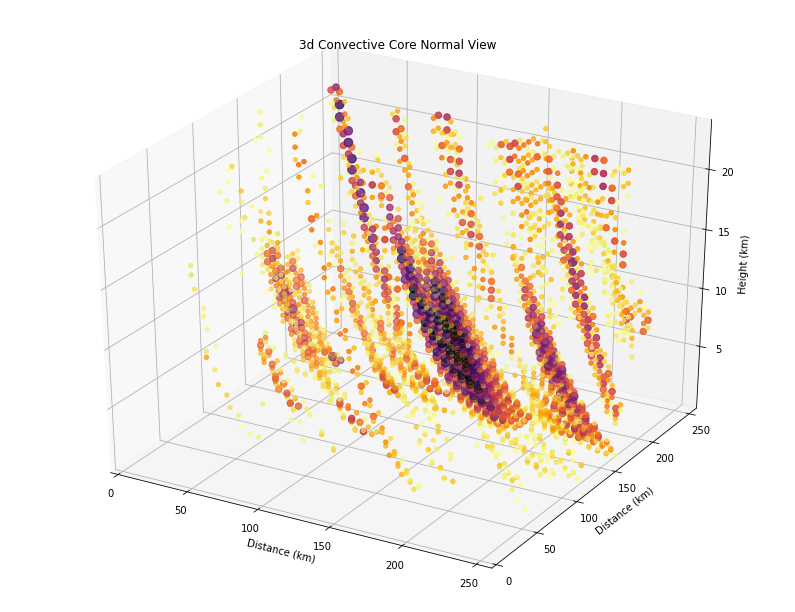

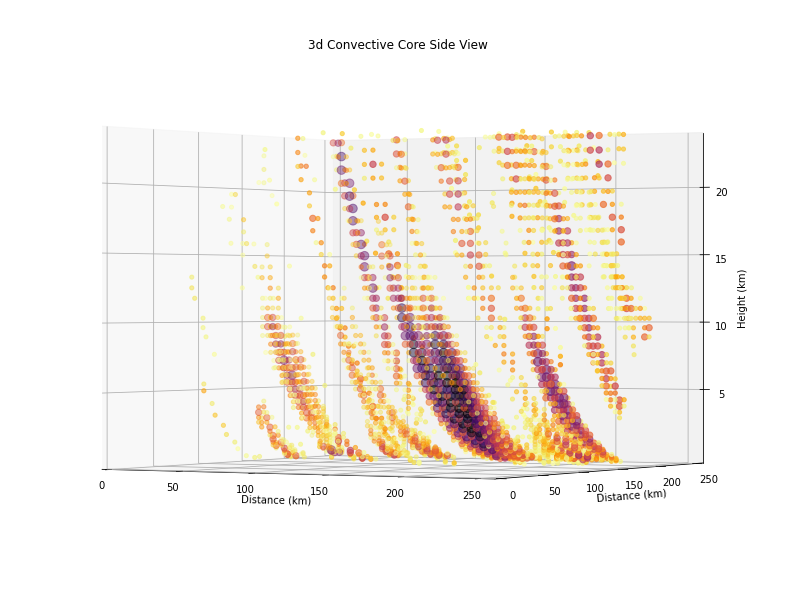

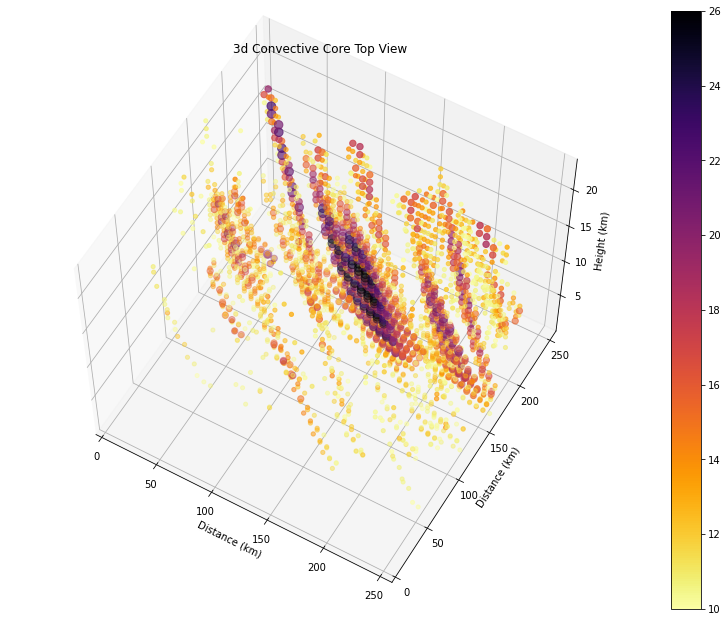

In [ ]:
#meshgrid for x-y-z 3D graph
x3d, y3d, z3d = np.meshgrid(cdf7_x, cdf7_y, cdf7_z) 

#Used work from team Mammatus
from mpl_toolkits.mplot3d import Axes3D

#Creates normal view graph
fig = plt.figure(figsize=(14,11))
ax = fig.add_subplot(111, projection='3d')
ax.set_title('3d Convective Core Normal View')
ax.set_xlim(cdf7_x[0],cdf7_x[-1])
ax.set_ylim(cdf7_y[0],cdf7_y[-1])
ax.set_zlim(cdf7_z[0],cdf7_z[-1])
ax.set_xlabel('Distance (km)')
ax.set_ylabel('Distance (km)')
ax.set_zlabel('Height (km)')

#Creates Side View Graph
fig = plt.figure(figsize=(14,11))
ax2 = fig.add_subplot(111, projection='3d')
ax2.set_title('3d Convective Core Side View')
ax2.set_xlim(cdf7_x[0],cdf7_x[-1])
ax2.set_ylim(cdf7_y[0],cdf7_y[-1])
ax2.set_zlim(cdf7_z[0],cdf7_z[-1])
ax2.set_xlabel('Distance (km)')
ax2.set_ylabel('Distance (km)')
ax2.set_zlabel('Height (km)')

#Creates Top View Graph
fig = plt.figure(figsize=(14,11))
ax3 = fig.add_subplot(111, projection='3d')
ax3.set_title('3d Convective Core Top View')
ax3.set_xlim(cdf7_x[0],cdf7_x[-1])
ax3.set_ylim(cdf7_y[0],cdf7_y[-1])
ax3.set_zlim(cdf7_z[0],cdf7_z[-1])
ax3.set_xlabel('Distance (km)')
ax3.set_ylabel('Distance (km)')
ax3.set_zlabel('Height (km)')

#Creates array for size of points
alphaVals = np.copy(cdf7_w)
alphaVals[alphaVals<10]=0
alphaVals_copy=alphaVals[alphaVals>10]
for x in alphaVals_copy:
  if x>10 and x<=15:
    alphaVals[alphaVals==x]=(abs(((x)/16)*10)+10)

  if x>15 and x<=20:
    alphaVals[alphaVals==x]=(abs(((x)/16)*10)+30)

  if x>20:
    alphaVals[alphaVals==x]=(abs(((x)/16)*10)+60)


#Sets view and plots normal view graph
ax.azim = -60
ax.dist = 10
ax.elev = 30
ax.scatter(x3d, y3d, z3d, c= cdf7_w[:,:,:],s=alphaVals, vmin=10, vmax=26, cmap='inferno_r')

#Sets view and plots side view graph
ax2.azim = -60
ax2.dist = 10
ax2.elev = 0
ax2.scatter(x3d, y3d, z3d, c= cdf7_w[:,:,:],s=alphaVals, vmin=10, vmax=26, cmap='inferno_r')

#Sets view and plots top view graph
ax3.azim = -60
ax3.dist = 10
ax3.elev = 60
ax3.scatter(x3d, y3d, z3d, c= cdf7_w[:,:,:],s=alphaVals, vmin=10, vmax=26, cmap='inferno_r')

#Plots colorbar and figures
p = ax.scatter(x3d, y3d, z3d, c = cdf7_w[:,:,:], s=alphaVals, vmin=10, vmax=26, cmap='inferno_r')

fig.colorbar(p)
fig.show()


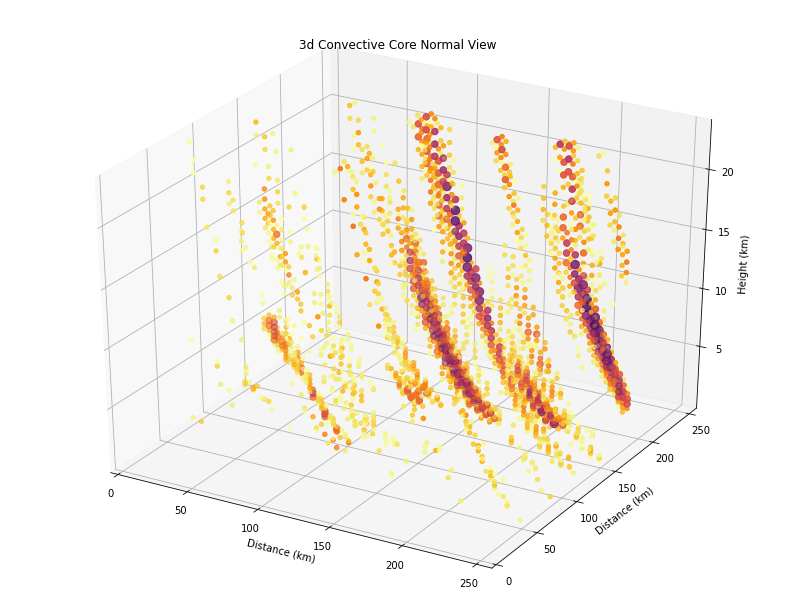

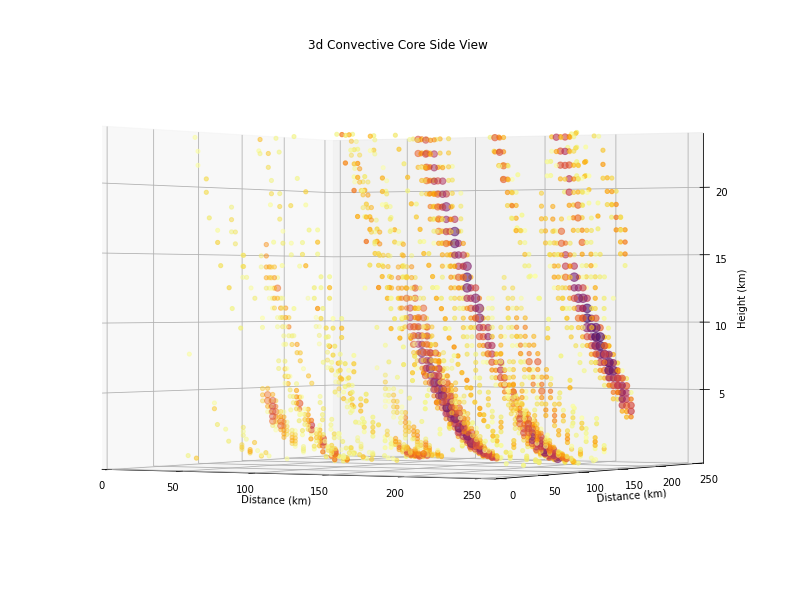

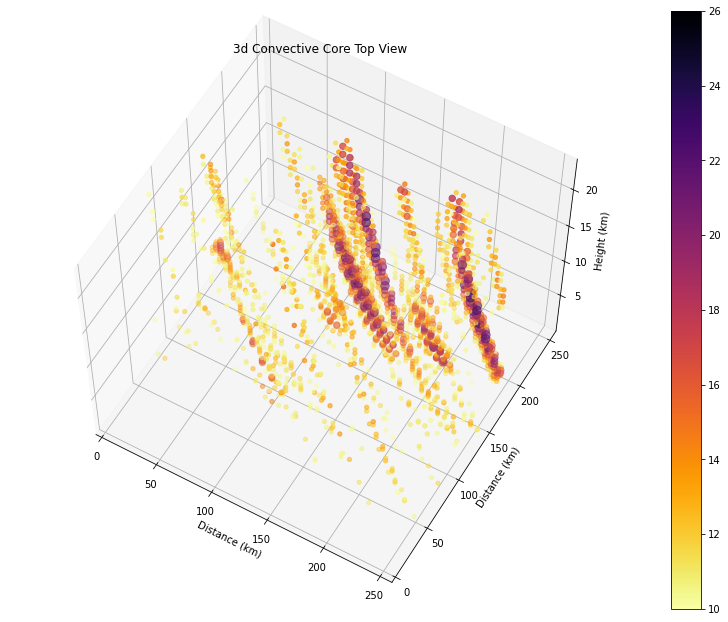

In [ ]:
#meshgrid for x-y-z 3D graph
x3d, y3d, z3d = np.meshgrid(cdf8_x, cdf8_y, cdf8_z) 

#Used work from team Mammatus
from mpl_toolkits.mplot3d import Axes3D

#Creates normal view graph
fig = plt.figure(figsize=(14,11))
ax = fig.add_subplot(111, projection='3d')
ax.set_title('3d Convective Core Normal View')
ax.set_xlim(cdf8_x[0],cdf8_x[-1])
ax.set_ylim(cdf8_y[0],cdf8_y[-1])
ax.set_zlim(cdf8_z[0],cdf8_z[-1])
ax.set_xlabel('Distance (km)')
ax.set_ylabel('Distance (km)')
ax.set_zlabel('Height (km)')

#Creates Side View Graph
fig = plt.figure(figsize=(14,11))
ax2 = fig.add_subplot(111, projection='3d')
ax2.set_title('3d Convective Core Side View')
ax2.set_xlim(cdf8_x[0],cdf8_x[-1])
ax2.set_ylim(cdf8_y[0],cdf8_y[-1])
ax2.set_zlim(cdf8_z[0],cdf8_z[-1])
ax2.set_xlabel('Distance (km)')
ax2.set_ylabel('Distance (km)')
ax2.set_zlabel('Height (km)')

#Creates Top View Graph
fig = plt.figure(figsize=(14,11))
ax3 = fig.add_subplot(111, projection='3d')
ax3.set_title('3d Convective Core Top View')
ax3.set_xlim(cdf8_x[0],cdf8_x[-1])
ax3.set_ylim(cdf8_y[0],cdf8_y[-1])
ax3.set_zlim(cdf8_z[0],cdf8_z[-1])
ax3.set_xlabel('Distance (km)')
ax3.set_ylabel('Distance (km)')
ax3.set_zlabel('Height (km)')

#Creates array for size of points
alphaVals = np.copy(cdf8_w)
alphaVals[alphaVals<10]=0
alphaVals_copy=alphaVals[alphaVals>10]
for x in alphaVals_copy:
  if x>10 and x<=15:
    alphaVals[alphaVals==x]=(abs(((x)/16)*10)+10)

  if x>15 and x<=20:
    alphaVals[alphaVals==x]=(abs(((x)/16)*10)+30)

  if x>20:
    alphaVals[alphaVals==x]=(abs(((x)/16)*10)+60)


#Sets view and plots normal view graph
ax.azim = -60
ax.dist = 10
ax.elev = 30
ax.scatter(x3d, y3d, z3d, c= cdf8_w[:,:,:],s=alphaVals, vmin=10, vmax=26, cmap='inferno_r')

#Sets view and plots side view graph
ax2.azim = -60
ax2.dist = 10
ax2.elev = 0
ax2.scatter(x3d, y3d, z3d, c= cdf8_w[:,:,:],s=alphaVals, vmin=10, vmax=26, cmap='inferno_r')

#Sets view and plots top view graph
ax3.azim = -60
ax3.dist = 10
ax3.elev = 60
ax3.scatter(x3d, y3d, z3d, c= cdf8_w[:,:,:],s=alphaVals, vmin=10, vmax=26, cmap='inferno_r')

#Plots colorbar and figures
p = ax.scatter(x3d, y3d, z3d, c = cdf8_w[:,:,:], s=alphaVals, vmin=10, vmax=26, cmap='inferno_r')

fig.colorbar(p)
fig.show()


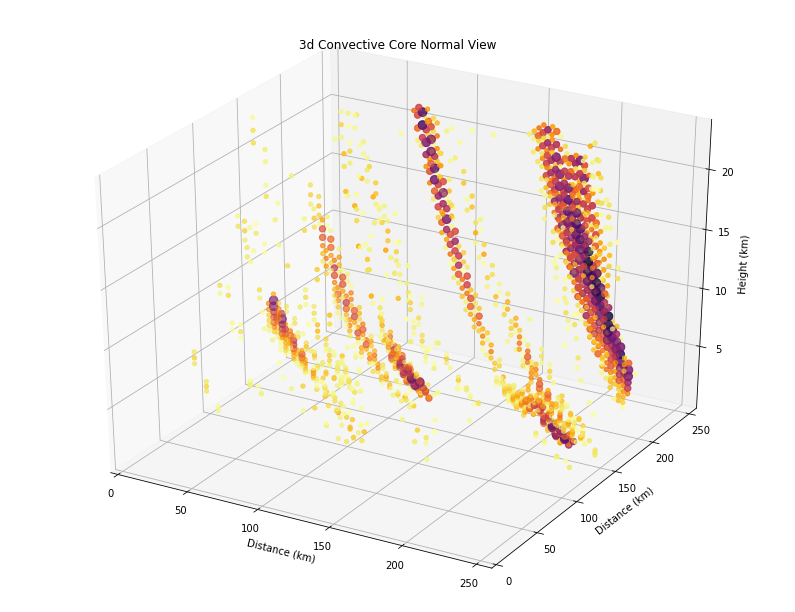

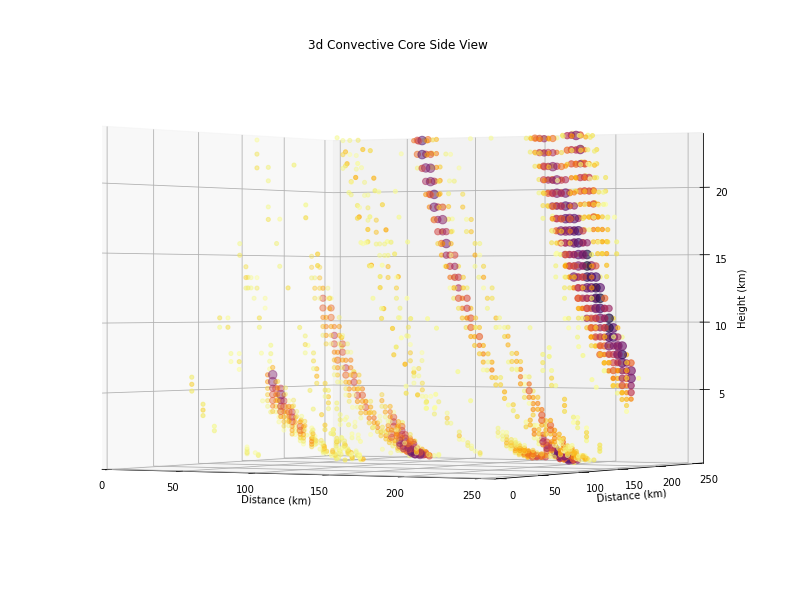

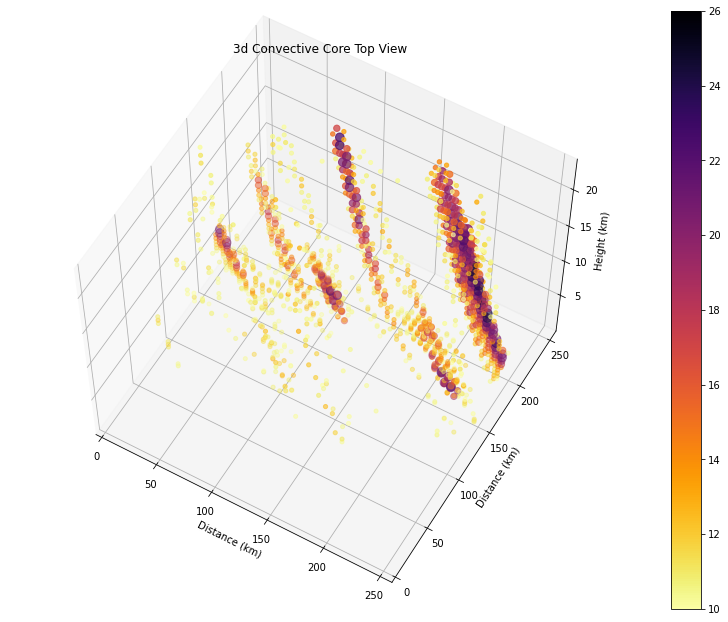

In [ ]:
#meshgrid for x-y-z 3D graph
x3d, y3d, z3d = np.meshgrid(cdf9_x, cdf9_y, cdf9_z) 

#Used work from team Mammatus
from mpl_toolkits.mplot3d import Axes3D

#Creates normal view graph
fig = plt.figure(figsize=(14,11))
ax = fig.add_subplot(111, projection='3d')
ax.set_title('3d Convective Core Normal View')
ax.set_xlim(cdf9_x[0],cdf9_x[-1])
ax.set_ylim(cdf9_y[0],cdf9_y[-1])
ax.set_zlim(cdf9_z[0],cdf9_z[-1])
ax.set_xlabel('Distance (km)')
ax.set_ylabel('Distance (km)')
ax.set_zlabel('Height (km)')

#Creates Side View Graph
fig = plt.figure(figsize=(14,11))
ax2 = fig.add_subplot(111, projection='3d')
ax2.set_title('3d Convective Core Side View')
ax2.set_xlim(cdf9_x[0],cdf9_x[-1])
ax2.set_ylim(cdf9_y[0],cdf9_y[-1])
ax2.set_zlim(cdf9_z[0],cdf9_z[-1])
ax2.set_xlabel('Distance (km)')
ax2.set_ylabel('Distance (km)')
ax2.set_zlabel('Height (km)')

#Creates Top View Graph
fig = plt.figure(figsize=(14,11))
ax3 = fig.add_subplot(111, projection='3d')
ax3.set_title('3d Convective Core Top View')
ax3.set_xlim(cdf9_x[0],cdf9_x[-1])
ax3.set_ylim(cdf9_y[0],cdf9_y[-1])
ax3.set_zlim(cdf9_z[0],cdf9_z[-1])
ax3.set_xlabel('Distance (km)')
ax3.set_ylabel('Distance (km)')
ax3.set_zlabel('Height (km)')

#Creates array for size of points
alphaVals = np.copy(cdf9_w)
alphaVals[alphaVals<10]=0
alphaVals_copy=alphaVals[alphaVals>10]
for x in alphaVals_copy:
  if x>10 and x<=15:
    alphaVals[alphaVals==x]=(abs(((x)/16)*10)+10)

  if x>15 and x<=20:
    alphaVals[alphaVals==x]=(abs(((x)/16)*10)+30)

  if x>20:
    alphaVals[alphaVals==x]=(abs(((x)/16)*10)+60)


#Sets view and plots normal view graph
ax.azim = -60
ax.dist = 10
ax.elev = 30
ax.scatter(x3d, y3d, z3d, c= cdf9_w[:,:,:],s=alphaVals, vmin=10, vmax=26, cmap='inferno_r')

#Sets view and plots side view graph
ax2.azim = -60
ax2.dist = 10
ax2.elev = 0
ax2.scatter(x3d, y3d, z3d, c= cdf9_w[:,:,:],s=alphaVals, vmin=10, vmax=26, cmap='inferno_r')

#Sets view and plots top view graph
ax3.azim = -60
ax3.dist = 10
ax3.elev = 60
ax3.scatter(x3d, y3d, z3d, c= cdf9_w[:,:,:],s=alphaVals, vmin=10, vmax=26, cmap='inferno_r')

#Plots colorbar and figures
p = ax.scatter(x3d, y3d, z3d, c = cdf9_w[:,:,:], s=alphaVals, vmin=10, vmax=26, cmap='inferno_r')

fig.colorbar(p)
fig.show()


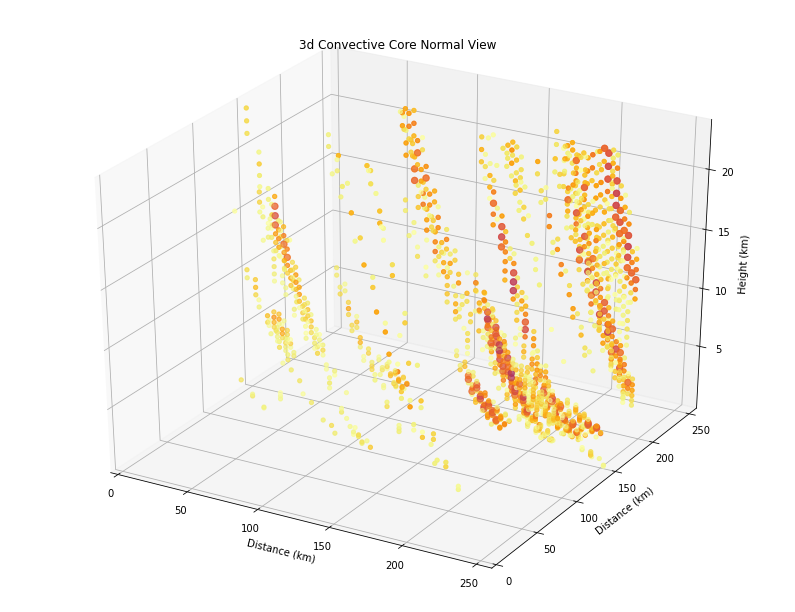

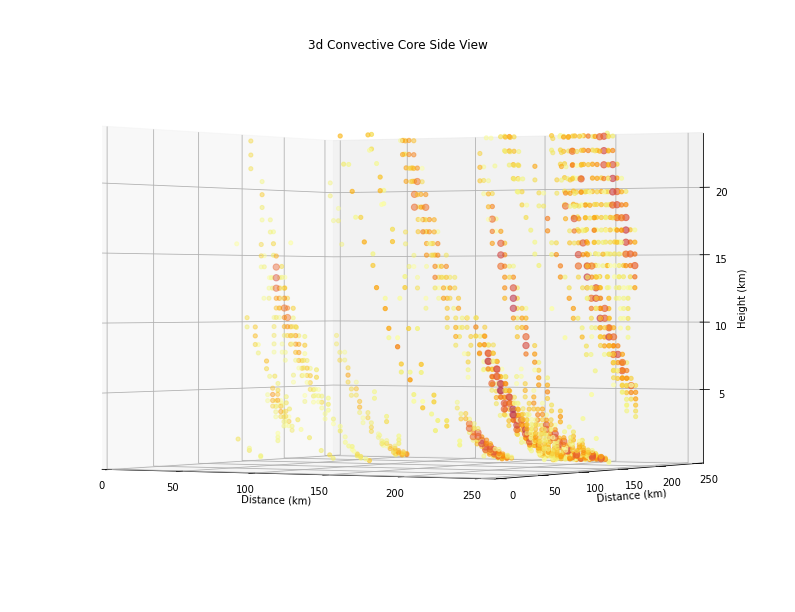

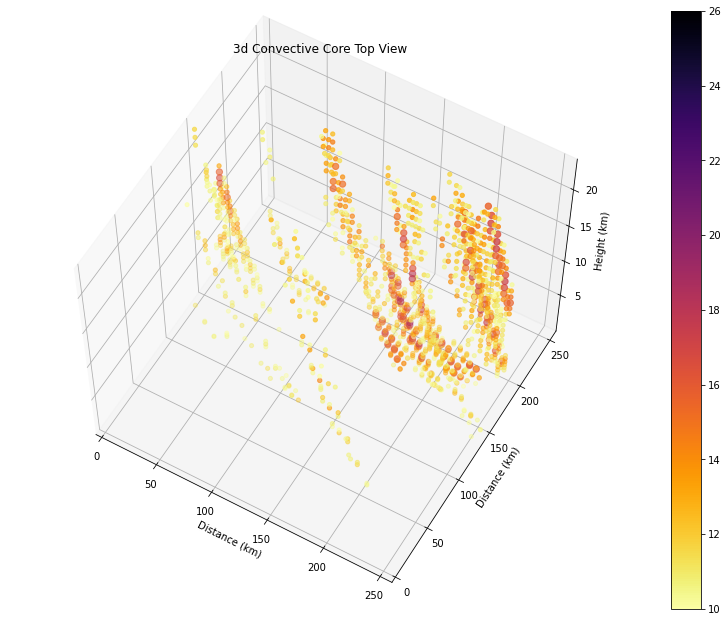

In [ ]:
#meshgrid for x-y-z 3D graph
x3d, y3d, z3d = np.meshgrid(cdf10_x, cdf10_y, cdf10_z) 

#Used work from team Mammatus
from mpl_toolkits.mplot3d import Axes3D

#Creates normal view graph
fig = plt.figure(figsize=(14,11))
ax = fig.add_subplot(111, projection='3d')
ax.set_title('3d Convective Core Normal View')
ax.set_xlim(cdf10_x[0],cdf10_x[-1])
ax.set_ylim(cdf10_y[0],cdf10_y[-1])
ax.set_zlim(cdf10_z[0],cdf10_z[-1])
ax.set_xlabel('Distance (km)')
ax.set_ylabel('Distance (km)')
ax.set_zlabel('Height (km)')

#Creates Side View Graph
fig = plt.figure(figsize=(14,11))
ax2 = fig.add_subplot(111, projection='3d')
ax2.set_title('3d Convective Core Side View')
ax2.set_xlim(cdf10_x[0],cdf10_x[-1])
ax2.set_ylim(cdf10_y[0],cdf10_y[-1])
ax2.set_zlim(cdf10_z[0],cdf10_z[-1])
ax2.set_xlabel('Distance (km)')
ax2.set_ylabel('Distance (km)')
ax2.set_zlabel('Height (km)')

#Creates Top View Graph
fig = plt.figure(figsize=(14,11))
ax3 = fig.add_subplot(111, projection='3d')
ax3.set_title('3d Convective Core Top View')
ax3.set_xlim(cdf10_x[0],cdf10_x[-1])
ax3.set_ylim(cdf10_y[0],cdf10_y[-1])
ax3.set_zlim(cdf10_z[0],cdf10_z[-1])
ax3.set_xlabel('Distance (km)')
ax3.set_ylabel('Distance (km)')
ax3.set_zlabel('Height (km)')

#Creates array for size of points
alphaVals = np.copy(cdf10_w)
alphaVals[alphaVals<10]=0
alphaVals_copy=alphaVals[alphaVals>10]
for x in alphaVals_copy:
  if x>10 and x<=15:
    alphaVals[alphaVals==x]=(abs(((x)/16)*10)+10)

  if x>15 and x<=20:
    alphaVals[alphaVals==x]=(abs(((x)/16)*10)+30)

  if x>20:
    alphaVals[alphaVals==x]=(abs(((x)/16)*10)+60)


#Sets view and plots normal view graph
ax.azim = -60
ax.dist = 10
ax.elev = 30
ax.scatter(x3d, y3d, z3d, c= cdf10_w[:,:,:],s=alphaVals, vmin=10, vmax=26, cmap='inferno_r')

#Sets view and plots side view graph
ax2.azim = -60
ax2.dist = 10
ax2.elev = 0
ax2.scatter(x3d, y3d, z3d, c= cdf10_w[:,:,:],s=alphaVals, vmin=10, vmax=26, cmap='inferno_r')

#Sets view and plots top view graph
ax3.azim = -60
ax3.dist = 10
ax3.elev = 60
ax3.scatter(x3d, y3d, z3d, c= cdf10_w[:,:,:],s=alphaVals, vmin=10, vmax=26, cmap='inferno_r')

#Plots colorbar and figures
p = ax.scatter(x3d, y3d, z3d, c = cdf10_w[:,:,:], s=alphaVals, vmin=10, vmax=26, cmap='inferno_r')

fig.colorbar(p)
fig.show()


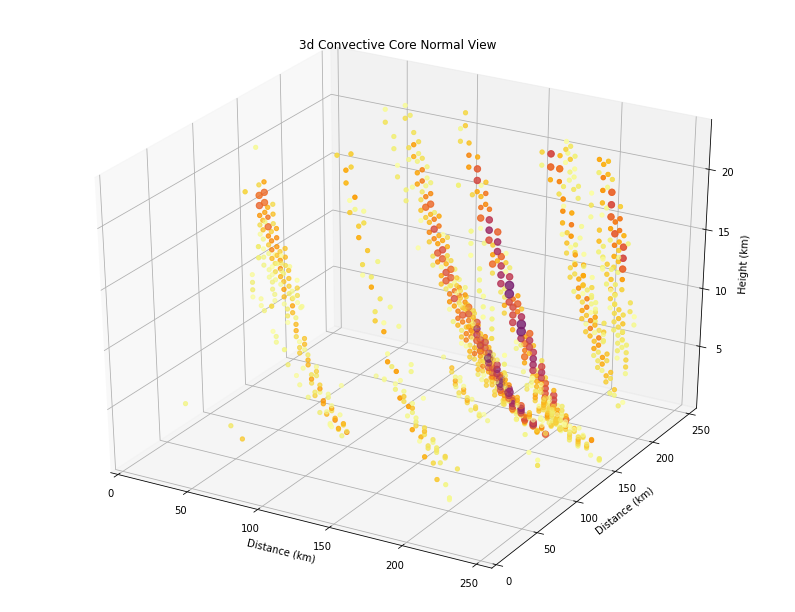

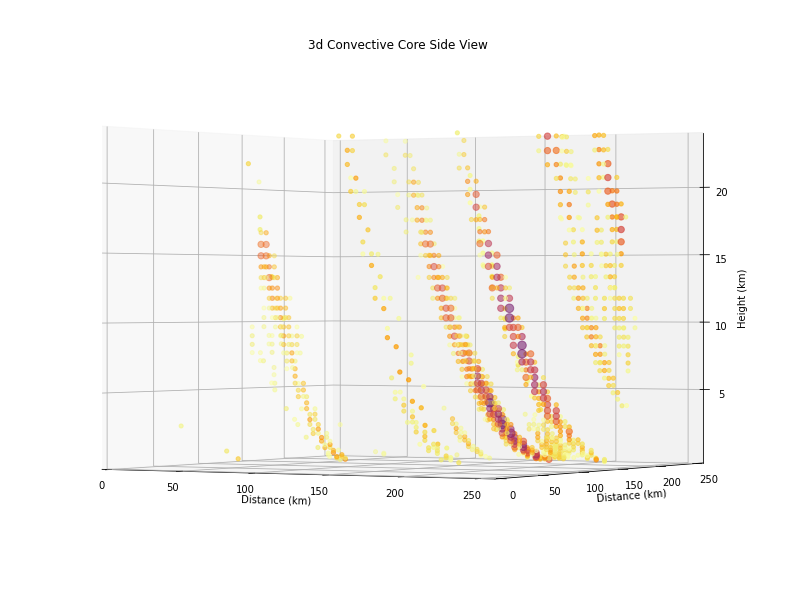

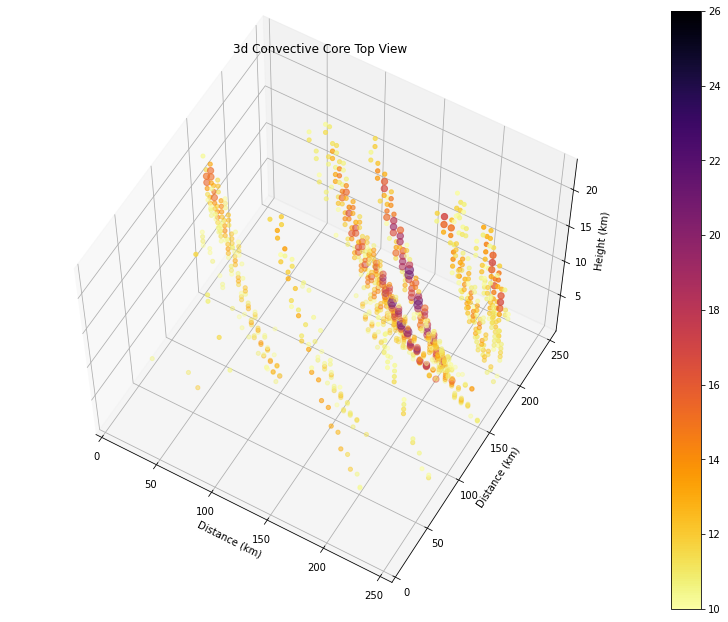

In [ ]:
#meshgrid for x-y-z 3D graph
x3d, y3d, z3d = np.meshgrid(cdf11_x, cdf11_y, cdf11_z) 

#Used work from team Mammatus
from mpl_toolkits.mplot3d import Axes3D

#Creates normal view graph
fig = plt.figure(figsize=(14,11))
ax = fig.add_subplot(111, projection='3d')
ax.set_title('3d Convective Core Normal View')
ax.set_xlim(cdf11_x[0],cdf11_x[-1])
ax.set_ylim(cdf11_y[0],cdf11_y[-1])
ax.set_zlim(cdf11_z[0],cdf11_z[-1])
ax.set_xlabel('Distance (km)')
ax.set_ylabel('Distance (km)')
ax.set_zlabel('Height (km)')

#Creates Side View Graph
fig = plt.figure(figsize=(14,11))
ax2 = fig.add_subplot(111, projection='3d')
ax2.set_title('3d Convective Core Side View')
ax2.set_xlim(cdf11_x[0],cdf11_x[-1])
ax2.set_ylim(cdf11_y[0],cdf11_y[-1])
ax2.set_zlim(cdf11_z[0],cdf11_z[-1])
ax2.set_xlabel('Distance (km)')
ax2.set_ylabel('Distance (km)')
ax2.set_zlabel('Height (km)')

#Creates Top View Graph
fig = plt.figure(figsize=(14,11))
ax3 = fig.add_subplot(111, projection='3d')
ax3.set_title('3d Convective Core Top View')
ax3.set_xlim(cdf11_x[0],cdf11_x[-1])
ax3.set_ylim(cdf11_y[0],cdf11_y[-1])
ax3.set_zlim(cdf11_z[0],cdf11_z[-1])
ax3.set_xlabel('Distance (km)')
ax3.set_ylabel('Distance (km)')
ax3.set_zlabel('Height (km)')

#Creates array for size of points
alphaVals = np.copy(cdf11_w)
alphaVals[alphaVals<10]=0
alphaVals_copy=alphaVals[alphaVals>10]
for x in alphaVals_copy:
  if x>10 and x<=15:
    alphaVals[alphaVals==x]=(abs(((x)/16)*10)+10)

  if x>15 and x<=20:
    alphaVals[alphaVals==x]=(abs(((x)/16)*10)+30)

  if x>20:
    alphaVals[alphaVals==x]=(abs(((x)/16)*10)+60)


#Sets view and plots normal view graph
ax.azim = -60
ax.dist = 10
ax.elev = 30
ax.scatter(x3d, y3d, z3d, c= cdf11_w[:,:,:],s=alphaVals, vmin=10, vmax=26, cmap='inferno_r')

#Sets view and plots side view graph
ax2.azim = -60
ax2.dist = 10
ax2.elev = 0
ax2.scatter(x3d, y3d, z3d, c= cdf11_w[:,:,:],s=alphaVals, vmin=10, vmax=26, cmap='inferno_r')

#Sets view and plots top view graph
ax3.azim = -60
ax3.dist = 10
ax3.elev = 60
ax3.scatter(x3d, y3d, z3d, c= cdf11_w[:,:,:],s=alphaVals, vmin=10, vmax=26, cmap='inferno_r')

#Plots colorbar and figures
p = ax.scatter(x3d, y3d, z3d, c = cdf11_w[:,:,:], s=alphaVals, vmin=10, vmax=26, cmap='inferno_r')

fig.colorbar(p)
fig.show()


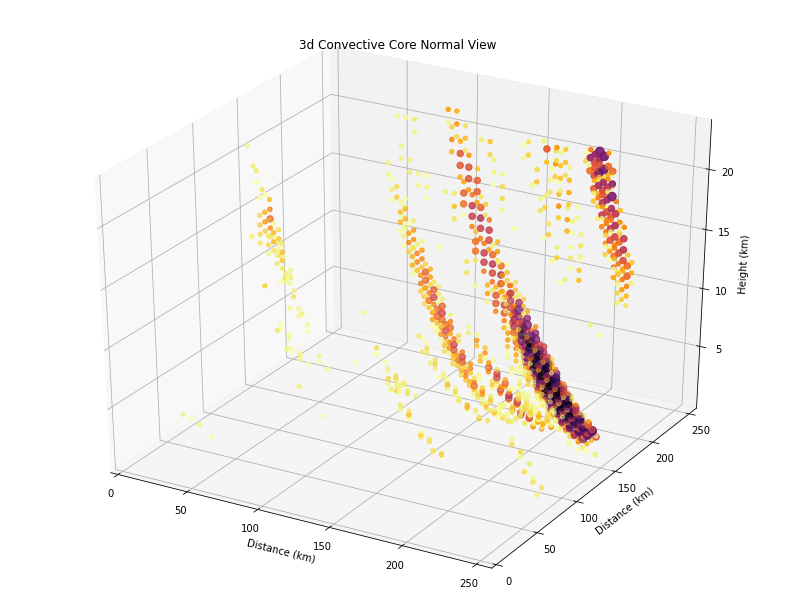

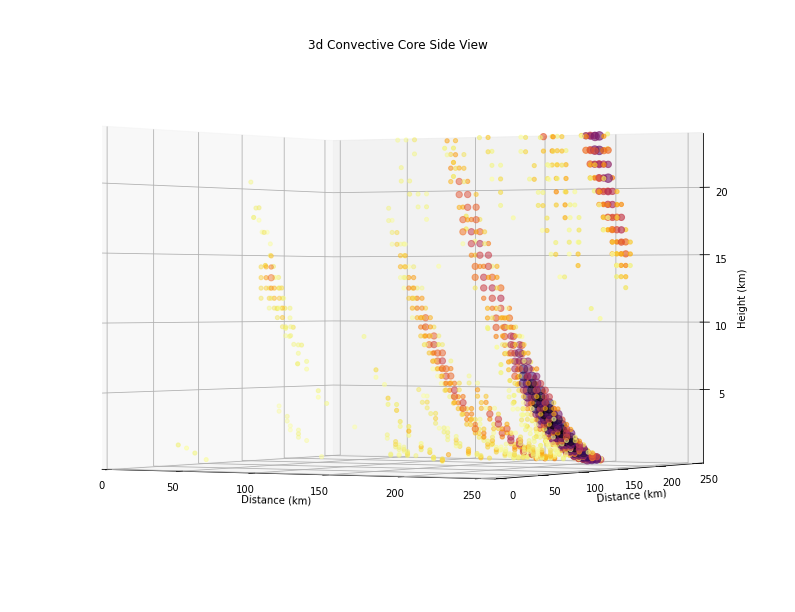

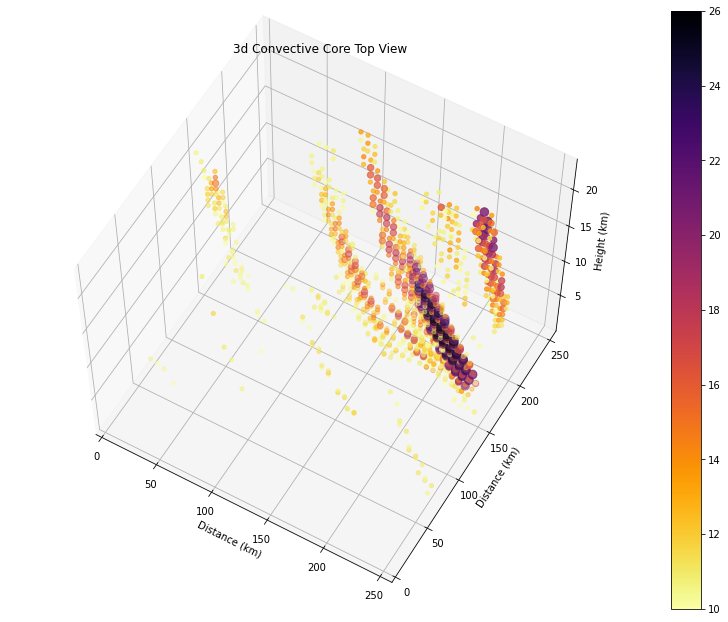

In [ ]:
#meshgrid for x-y-z 3D graph
x3d, y3d, z3d = np.meshgrid(cdf12_x, cdf12_y, cdf12_z) 

#Used work from team Mammatus
from mpl_toolkits.mplot3d import Axes3D

#Creates normal view graph
fig = plt.figure(figsize=(14,11))
ax = fig.add_subplot(111, projection='3d')
ax.set_title('3d Convective Core Normal View')
ax.set_xlim(cdf12_x[0],cdf12_x[-1])
ax.set_ylim(cdf12_y[0],cdf12_y[-1])
ax.set_zlim(cdf12_z[0],cdf12_z[-1])
ax.set_xlabel('Distance (km)')
ax.set_ylabel('Distance (km)')
ax.set_zlabel('Height (km)')

#Creates Side View Graph
fig = plt.figure(figsize=(14,11))
ax2 = fig.add_subplot(111, projection='3d')
ax2.set_title('3d Convective Core Side View')
ax2.set_xlim(cdf12_x[0],cdf12_x[-1])
ax2.set_ylim(cdf12_y[0],cdf12_y[-1])
ax2.set_zlim(cdf12_z[0],cdf12_z[-1])
ax2.set_xlabel('Distance (km)')
ax2.set_ylabel('Distance (km)')
ax2.set_zlabel('Height (km)')

#Creates Top View Graph
fig = plt.figure(figsize=(14,11))
ax3 = fig.add_subplot(111, projection='3d')
ax3.set_title('3d Convective Core Top View')
ax3.set_xlim(cdf12_x[0],cdf12_x[-1])
ax3.set_ylim(cdf12_y[0],cdf12_y[-1])
ax3.set_zlim(cdf12_z[0],cdf12_z[-1])
ax3.set_xlabel('Distance (km)')
ax3.set_ylabel('Distance (km)')
ax3.set_zlabel('Height (km)')

#Creates array for size of points
alphaVals = np.copy(cdf12_w)
alphaVals[alphaVals<10]=0
alphaVals_copy=alphaVals[alphaVals>10]
for x in alphaVals_copy:
  if x>10 and x<=15:
    alphaVals[alphaVals==x]=(abs(((x)/16)*10)+10)

  if x>15 and x<=20:
    alphaVals[alphaVals==x]=(abs(((x)/16)*10)+30)

  if x>20:
    alphaVals[alphaVals==x]=(abs(((x)/16)*10)+60)


#Sets view and plots normal view graph
ax.azim = -60
ax.dist = 10
ax.elev = 30
ax.scatter(x3d, y3d, z3d, c= cdf12_w[:,:,:],s=alphaVals, vmin=10, vmax=26, cmap='inferno_r')

#Sets view and plots side view graph
ax2.azim = -60
ax2.dist = 10
ax2.elev = 0
ax2.scatter(x3d, y3d, z3d, c= cdf12_w[:,:,:],s=alphaVals, vmin=10, vmax=26, cmap='inferno_r')

#Sets view and plots top view graph
ax3.azim = -60
ax3.dist = 10
ax3.elev = 60
ax3.scatter(x3d, y3d, z3d, c= cdf12_w[:,:,:],s=alphaVals, vmin=10, vmax=26, cmap='inferno_r')

#Plots colorbar and figures
p = ax.scatter(x3d, y3d, z3d, c = cdf12_w[:,:,:], s=alphaVals, vmin=10, vmax=26, cmap='inferno_r')

fig.colorbar(p)
fig.show()


# Objective 3: Clustering 2D Snapshots

In objective 3 we focus on clustering our 2d snapshots in order to eventually cluster our 3d convective core plots. First we used morphology from the scipy package in order to label and segment our arrays. This would determine if there was a cluster present within our numpy array. We then displayed it using the plt.imshow method. The graphs are equivalent to the above 2d snapshots in objective 1 however clustering is shown through our custom colormap.

In [ ]:
from scipy.ndimage import label, binary_dilation
from scipy import ndimage
import palettable
import matplotlib.colors as mcolors
from matplotlib import cm
from matplotlib.colors import ListedColormap, LinearSegmentedColormap

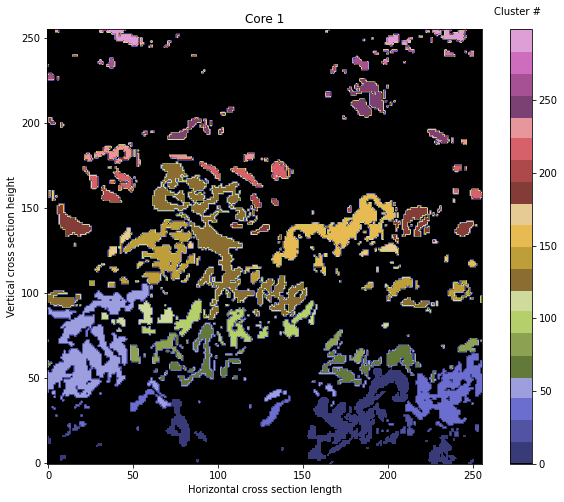

In [ ]:
#Segmenting array
a=cdf1_w[18,:,:]
a=np.where(a>0,1,0)

#structure array
struct = np.array([[True,True,True],[True, True, True],[True, True, True]])

#Labeling 
labels_test, num_features = label(a,struct)

#Adds labels to each graph
plt.figure(figsize=(10,8))
plt.title('Core 1')
plt.xlabel('Horizontal cross section length')
plt.ylabel('Vertical cross section height')


#Creates custom colormap to display value 0 as black
viridis = cm.get_cmap('tab20b', 256)
newcolors = viridis(np.linspace(0, 1, 256))
black = np.array([0/256, 0/256, 0/256, 1])
newcolors[:1, :] = black
newcmp = ListedColormap(newcolors)

#Shows image
plt.imshow(labels_test, cmap= newcmp)
# setting the lower and upper limits of the colorbar
clb=plt.colorbar(orientation='vertical')
clb.set_label('Cluster #', labelpad=-40, y=1.05, rotation=0)
plt.gca().invert_yaxis()



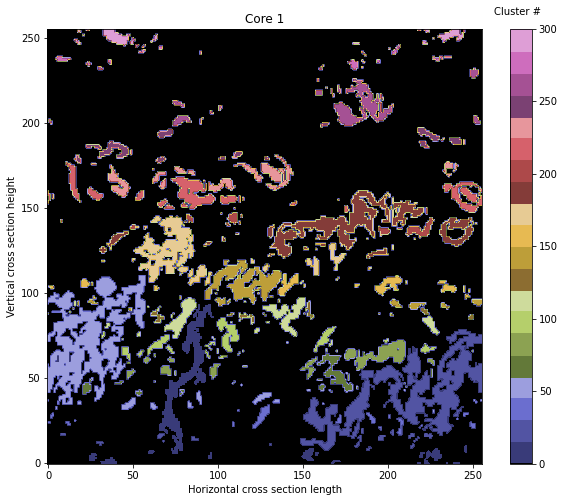

In [ ]:
#Segmenting array
a=cdf2_w[18,:,:]
a=np.where(a>0,1,0)

#structure array
struct = np.array([[True,True,True],[True, True, True],[True, True, True]])

#Labeling 
labels_test, num_features = label(a,struct)

#Adds labels to each graph
plt.figure(figsize=(10,8))
plt.title('Core 1')
plt.xlabel('Horizontal cross section length')
plt.ylabel('Vertical cross section height')


#Creates custom colormap to display value 0 as black
viridis = cm.get_cmap('tab20b', 256)
newcolors = viridis(np.linspace(0, 1, 256))
black = np.array([0/256, 0/256, 0/256, 1])
newcolors[:1, :] = black
newcmp = ListedColormap(newcolors)

#Shows image
plt.imshow(labels_test, cmap= newcmp)
# setting the lower and upper limits of the colorbar
clb=plt.colorbar(orientation='vertical')
clb.set_label('Cluster #', labelpad=-40, y=1.05, rotation=0)
plt.gca().invert_yaxis()

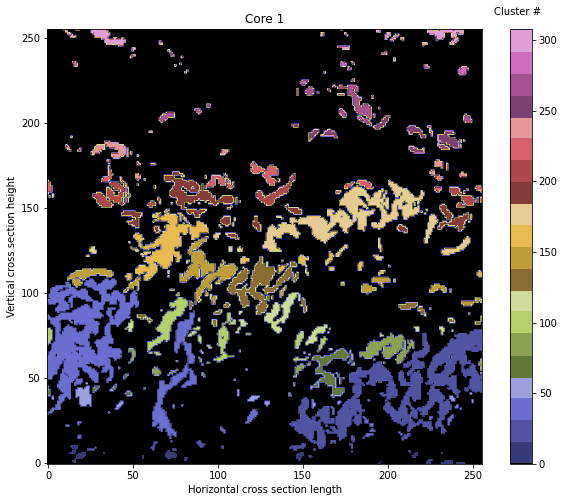

In [ ]:
#Segmenting array
a=cdf3_w[18,:,:]
a=np.where(a>0,1,0)

#structure array
struct = np.array([[True,True,True],[True, True, True],[True, True, True]])

#Labeling 
labels_test, num_features = label(a,struct)

#Adds labels to each graph
plt.figure(figsize=(10,8))
plt.title('Core 1')
plt.xlabel('Horizontal cross section length')
plt.ylabel('Vertical cross section height')


#Creates custom colormap to display value 0 as black
viridis = cm.get_cmap('tab20b', 256)
newcolors = viridis(np.linspace(0, 1, 256))
black = np.array([0/256, 0/256, 0/256, 1])
newcolors[:1, :] = black
newcmp = ListedColormap(newcolors)

#Shows image
plt.imshow(labels_test, cmap= newcmp)
# setting the lower and upper limits of the colorbar
clb=plt.colorbar(orientation='vertical')
clb.set_label('Cluster #', labelpad=-40, y=1.05, rotation=0)
plt.gca().invert_yaxis()

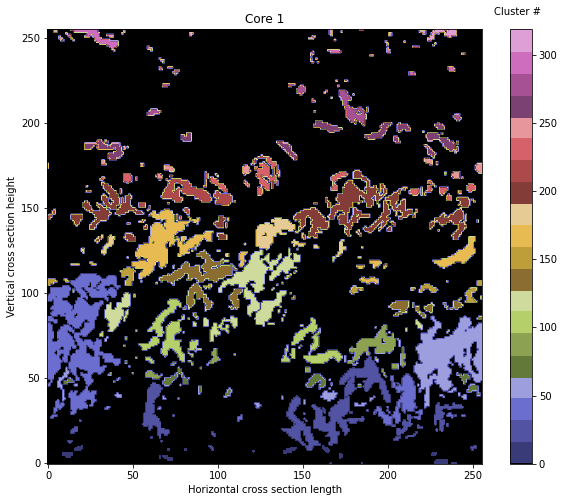

In [ ]:
#Segmenting array
a=cdf4_w[18,:,:]
a=np.where(a>0,1,0)

#structure array
struct = np.array([[True,True,True],[True, True, True],[True, True, True]])

#Labeling 
labels_test, num_features = label(a,struct)

#Adds labels to each graph
plt.figure(figsize=(10,8))
plt.title('Core 1')
plt.xlabel('Horizontal cross section length')
plt.ylabel('Vertical cross section height')


#Creates custom colormap to display value 0 as black
viridis = cm.get_cmap('tab20b', 256)
newcolors = viridis(np.linspace(0, 1, 256))
black = np.array([0/256, 0/256, 0/256, 1])
newcolors[:1, :] = black
newcmp = ListedColormap(newcolors)

#Shows image
plt.imshow(labels_test, cmap= newcmp)
# setting the lower and upper limits of the colorbar
clb=plt.colorbar(orientation='vertical')
clb.set_label('Cluster #', labelpad=-40, y=1.05, rotation=0)
plt.gca().invert_yaxis()

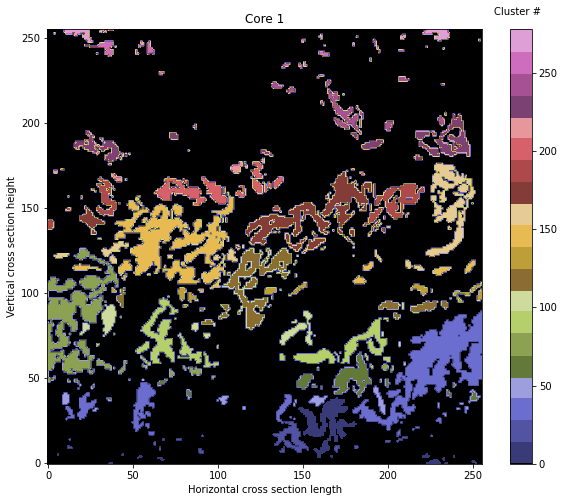

In [ ]:
#Segmenting array
a=cdf5_w[18,:,:]
a=np.where(a>0,1,0)

#structure array
struct = np.array([[True,True,True],[True, True, True],[True, True, True]])

#Labeling 
labels_test, num_features = label(a,struct)

#Adds labels to each graph
plt.figure(figsize=(10,8))
plt.title('Core 1')
plt.xlabel('Horizontal cross section length')
plt.ylabel('Vertical cross section height')


#Creates custom colormap to display value 0 as black
viridis = cm.get_cmap('tab20b', 256)
newcolors = viridis(np.linspace(0, 1, 256))
black = np.array([0/256, 0/256, 0/256, 1])
newcolors[:1, :] = black
newcmp = ListedColormap(newcolors)

#Shows image
plt.imshow(labels_test, cmap= newcmp)
# setting the lower and upper limits of the colorbar
clb=plt.colorbar(orientation='vertical')
clb.set_label('Cluster #', labelpad=-40, y=1.05, rotation=0)
plt.gca().invert_yaxis()

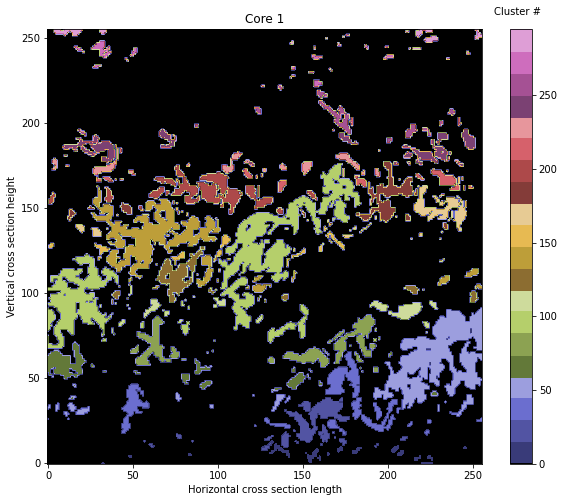

In [ ]:
#Segmenting array
a=cdf6_w[18,:,:]
a=np.where(a>0,1,0)

#structure array
struct = np.array([[True,True,True],[True, True, True],[True, True, True]])

#Labeling 
labels_test, num_features = label(a,struct)

#Adds labels to each graph
plt.figure(figsize=(10,8))
plt.title('Core 1')
plt.xlabel('Horizontal cross section length')
plt.ylabel('Vertical cross section height')


#Creates custom colormap to display value 0 as black
viridis = cm.get_cmap('tab20b', 256)
newcolors = viridis(np.linspace(0, 1, 256))
black = np.array([0/256, 0/256, 0/256, 1])
newcolors[:1, :] = black
newcmp = ListedColormap(newcolors)

#Shows image
plt.imshow(labels_test, cmap= newcmp)
# setting the lower and upper limits of the colorbar
clb=plt.colorbar(orientation='vertical')
clb.set_label('Cluster #', labelpad=-40, y=1.05, rotation=0)
plt.gca().invert_yaxis()

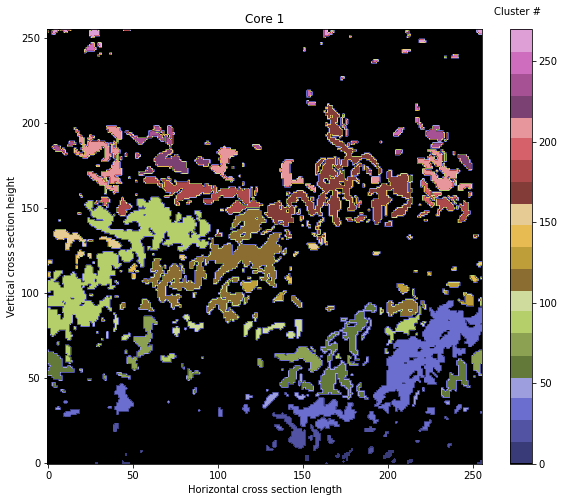

In [ ]:
#Segmenting array
a=cdf7_w[18,:,:]
a=np.where(a>0,1,0)

#structure array
struct = np.array([[True,True,True],[True, True, True],[True, True, True]])

#Labeling 
labels_test, num_features = label(a,struct)

#Adds labels to each graph
plt.figure(figsize=(10,8))
plt.title('Core 1')
plt.xlabel('Horizontal cross section length')
plt.ylabel('Vertical cross section height')


#Creates custom colormap to display value 0 as black
viridis = cm.get_cmap('tab20b', 256)
newcolors = viridis(np.linspace(0, 1, 256))
black = np.array([0/256, 0/256, 0/256, 1])
newcolors[:1, :] = black
newcmp = ListedColormap(newcolors)

#Shows image
plt.imshow(labels_test, cmap= newcmp)
# setting the lower and upper limits of the colorbar
clb=plt.colorbar(orientation='vertical')
clb.set_label('Cluster #', labelpad=-40, y=1.05, rotation=0)
plt.gca().invert_yaxis()

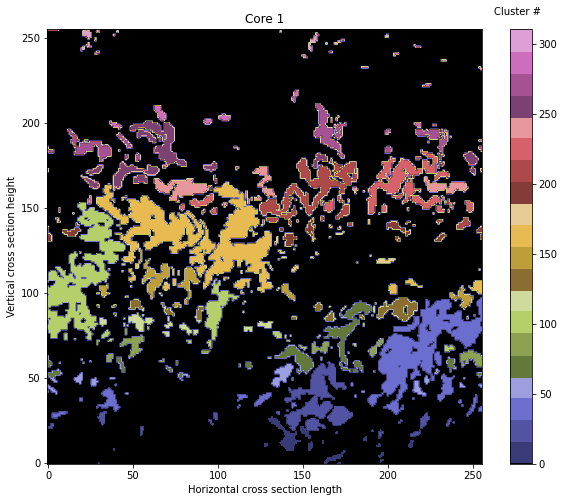

In [ ]:
#Segmenting array
a=cdf8_w[18,:,:]
a=np.where(a>0,1,0)

#structure array
struct = np.array([[True,True,True],[True, True, True],[True, True, True]])

#Labeling 
labels_test, num_features = label(a,struct)

#Adds labels to each graph
plt.figure(figsize=(10,8))
plt.title('Core 1')
plt.xlabel('Horizontal cross section length')
plt.ylabel('Vertical cross section height')


#Creates custom colormap to display value 0 as black
viridis = cm.get_cmap('tab20b', 256)
newcolors = viridis(np.linspace(0, 1, 256))
black = np.array([0/256, 0/256, 0/256, 1])
newcolors[:1, :] = black
newcmp = ListedColormap(newcolors)

#Shows image
plt.imshow(labels_test, cmap= newcmp)
# setting the lower and upper limits of the colorbar
clb=plt.colorbar(orientation='vertical')
clb.set_label('Cluster #', labelpad=-40, y=1.05, rotation=0)
plt.gca().invert_yaxis()

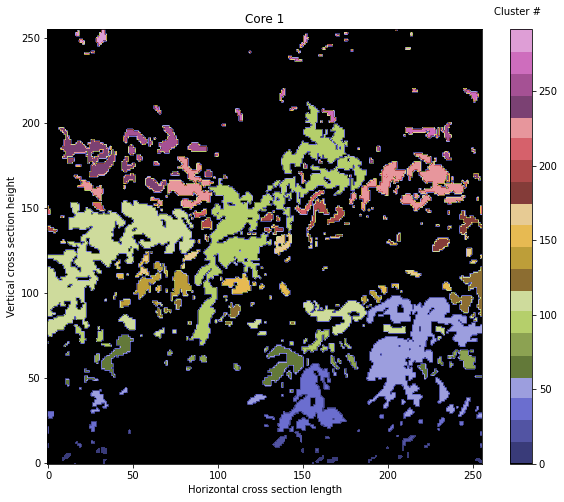

In [ ]:
#Segmenting array
a=cdf9_w[18,:,:]
a=np.where(a>0,1,0)

#structure array
struct = np.array([[True,True,True],[True, True, True],[True, True, True]])

#Labeling 
labels_test, num_features = label(a,struct)

#Adds labels to each graph
plt.figure(figsize=(10,8))
plt.title('Core 1')
plt.xlabel('Horizontal cross section length')
plt.ylabel('Vertical cross section height')


#Creates custom colormap to display value 0 as black
viridis = cm.get_cmap('tab20b', 256)
newcolors = viridis(np.linspace(0, 1, 256))
black = np.array([0/256, 0/256, 0/256, 1])
newcolors[:1, :] = black
newcmp = ListedColormap(newcolors)

#Shows image
plt.imshow(labels_test, cmap= newcmp)
# setting the lower and upper limits of the colorbar
clb=plt.colorbar(orientation='vertical')
clb.set_label('Cluster #', labelpad=-40, y=1.05, rotation=0)
plt.gca().invert_yaxis()

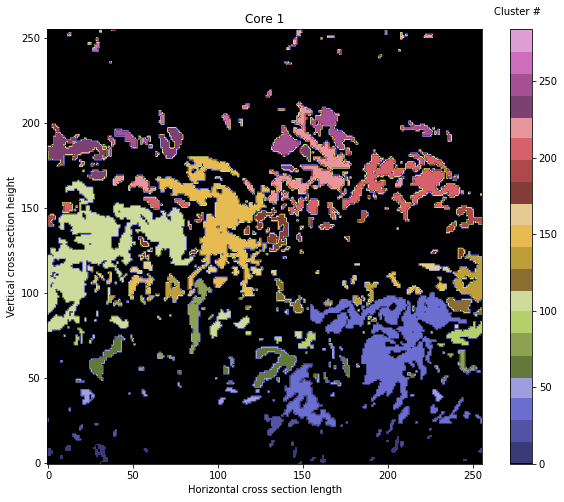

In [ ]:
#Segmenting array
a=cdf10_w[18,:,:]
a=np.where(a>0,1,0)

#structure array
struct = np.array([[True,True,True],[True, True, True],[True, True, True]])

#Labeling 
labels_test, num_features = label(a,struct)

#Adds labels to each graph
plt.figure(figsize=(10,8))
plt.title('Core 1')
plt.xlabel('Horizontal cross section length')
plt.ylabel('Vertical cross section height')


#Creates custom colormap to display value 0 as black
viridis = cm.get_cmap('tab20b', 256)
newcolors = viridis(np.linspace(0, 1, 256))
black = np.array([0/256, 0/256, 0/256, 1])
newcolors[:1, :] = black
newcmp = ListedColormap(newcolors)

#Shows image
plt.imshow(labels_test, cmap= newcmp)
# setting the lower and upper limits of the colorbar
clb=plt.colorbar(orientation='vertical')
clb.set_label('Cluster #', labelpad=-40, y=1.05, rotation=0)
plt.gca().invert_yaxis()

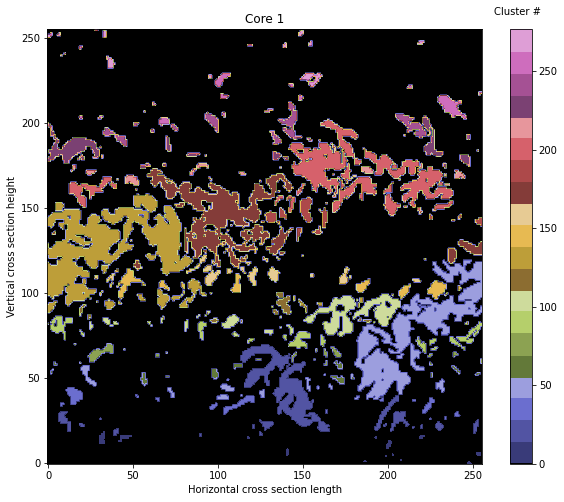

In [ ]:
#Segmenting array
a=cdf11_w[18,:,:]
a=np.where(a>0,1,0)

#structure array
struct = np.array([[True,True,True],[True, True, True],[True, True, True]])

#Labeling 
labels_test, num_features = label(a,struct)

#Adds labels to each graph
plt.figure(figsize=(10,8))
plt.title('Core 1')
plt.xlabel('Horizontal cross section length')
plt.ylabel('Vertical cross section height')


#Creates custom colormap to display value 0 as black
viridis = cm.get_cmap('tab20b', 256)
newcolors = viridis(np.linspace(0, 1, 256))
black = np.array([0/256, 0/256, 0/256, 1])
newcolors[:1, :] = black
newcmp = ListedColormap(newcolors)

#Shows image
plt.imshow(labels_test, cmap= newcmp)
# setting the lower and upper limits of the colorbar
clb=plt.colorbar(orientation='vertical')
clb.set_label('Cluster #', labelpad=-40, y=1.05, rotation=0)
plt.gca().invert_yaxis()

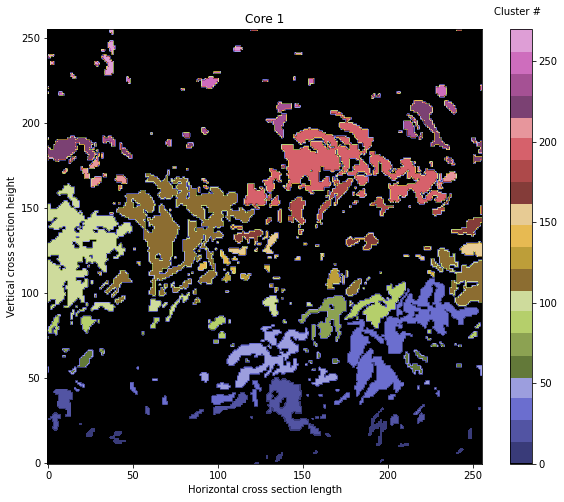

In [ ]:
#Segmenting array
a=cdf12_w[18,:,:]
a=np.where(a>0,1,0)

#structure array
struct = np.array([[True,True,True],[True, True, True],[True, True, True]])

#Labeling 
labels_test, num_features = label(a,struct)

#Adds labels to each graph
plt.figure(figsize=(10,8))
plt.title('Core 1')
plt.xlabel('Horizontal cross section length')
plt.ylabel('Vertical cross section height')


#Creates custom colormap to display value 0 as black
viridis = cm.get_cmap('tab20b', 256)
newcolors = viridis(np.linspace(0, 1, 256))
black = np.array([0/256, 0/256, 0/256, 1])
newcolors[:1, :] = black
newcmp = ListedColormap(newcolors)

#Shows image
plt.imshow(labels_test, cmap= newcmp)
# setting the lower and upper limits of the colorbar
clb=plt.colorbar(orientation='vertical')
clb.set_label('Cluster #', labelpad=-40, y=1.05, rotation=0)
plt.gca().invert_yaxis()

# Objective 4: Clustering 3d Convective Core Plots Using Morphology

In objective 4 we wanted to use our work from objective 3 to cluster our 3d convective core plots. First we used morphology to label and segment our arrays however this time we are using the 3d arrays. Also due to the larger dimension of the arrays we had to use binary dilation in order for it to work with the label method. Lastly we plotted the new arrays that were segmented and labeled. This gave us smaller amounts of clusters than the 2d clustering and more distinction between each cluster. Because of this we decided to take a part of our labeled and segmented 3d array and plot it as a 2d cross section in order to see the difference between the clustering methods.

Time Step 1: 3d clustering and 2d cross section 

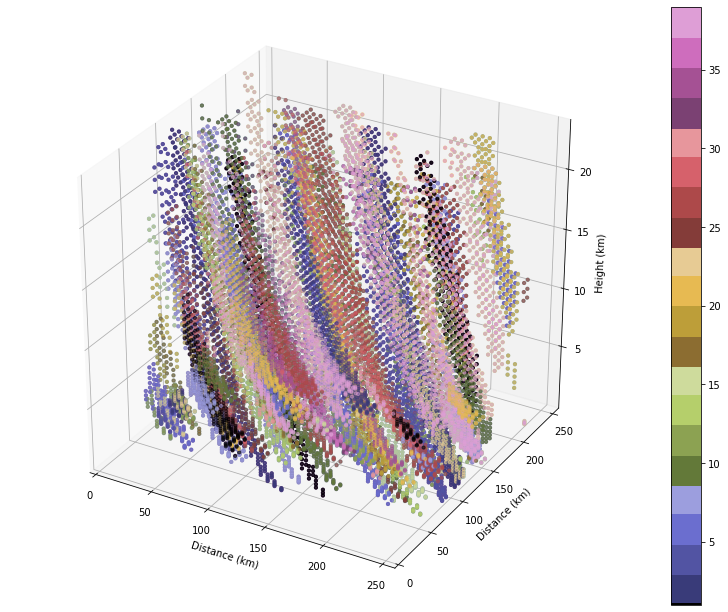

In [ ]:
#Segmenting array
b=cdf1_w[:,:,:]
b=np.where(b>10,1,0)

struct = np.zeros((3, 3, 3), dtype=int)
struct = np.array([[[True,True,True], [True,True,True], [True,True,True]], [[True,True,True], [True,True,True], [True,True,True]], [[True,True,True], [True,True,True], [True,True,True]]])
b = binary_dilation(b, structure=struct).astype(int)

#Labeling 
labels_test_3d, num_features_3d = label(b,struct)

#meshgrid for x-y-z 3D graph
x3d, y3d, z3d = np.meshgrid(cdf1_x, cdf1_y, cdf1_z) 
fig = plt.figure(figsize=(14,11))
ax = fig.add_subplot(111, projection='3d')

#Creates custom colormap to display value 0 as black
viridis = cm.get_cmap('tab20b', 256)
newcolors = viridis(np.linspace(0, 1, 256))
black = np.array([0/256, 0/256, 0/256, 1])
newcolors[:1, :] = black
newcmp = ListedColormap(newcolors)

#Sets limits and lables for x,y,z axis
ax.set_title('Clustering of 3d Convective Core')
ax.set_xlim(cdf1_x[0],cdf1_x[-1])
ax.set_ylim(cdf1_y[0],cdf1_y[-1])
ax.set_zlim(cdf1_z[0],cdf1_z[-1])
ax.set_xlabel('Distance (km)')
ax.set_ylabel('Distance (km)')
ax.set_zlabel('Height (km)')

#Used for size paramter
alphaVals = np.copy(labels_test_3d)
#Sets each value in array
alphaVals[alphaVals==0]=0
alphaVals[alphaVals>0]=10

ax.scatter(x3d, y3d, z3d, c= labels_test_3d, s=alphaVals)

p = ax.scatter(x3d, y3d, z3d, c = labels_test_3d, s=alphaVals, vmin=1, vmax=39, cmap=newcmp)
fig.colorbar(p)

fig.show()

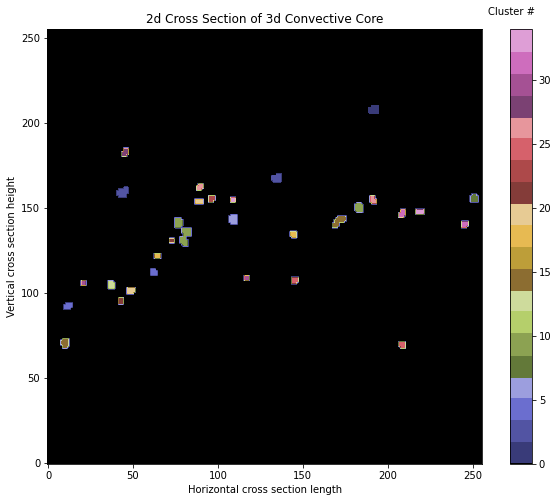

In [ ]:

#Adds labels to each graph
plt.figure(figsize=(10,8))
plt.title('2d Cross Section of 3d Convective Core')
plt.xlabel('Horizontal cross section length')
plt.ylabel('Vertical cross section height')

#Creates custom colormap to display value 0 as black
viridis = cm.get_cmap('tab20b', 256)
newcolors = viridis(np.linspace(0, 1, 256))
black = np.array([0/256, 0/256, 0/256, 1])
newcolors[:1, :] = black
newcmp = ListedColormap(newcolors)

#Shows image
plt.imshow(labels_test_3d[18,:,:], cmap= newcmp)
# setting the lower and upper limits of the colorbar
clb=plt.colorbar(orientation='vertical')
clb.set_label('Cluster #', labelpad=-40, y=1.05, rotation=0)
plt.gca().invert_yaxis()


Time Step 2: 3d clustering and 2d cross section 

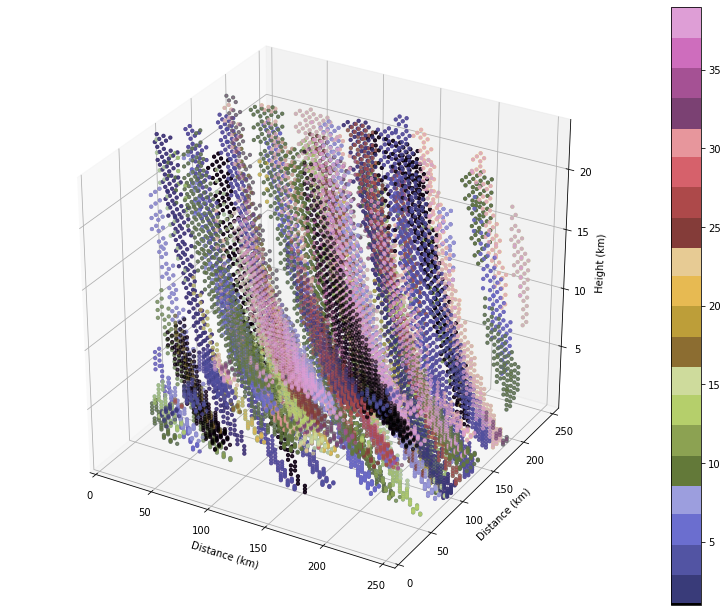

In [ ]:
#Segmenting array
b=cdf2_w[:,:,:]
b=np.where(b>10,1,0)

struct = np.zeros((3, 3, 3), dtype=int)
struct = np.array([[[True,True,True], [True,True,True], [True,True,True]], [[True,True,True], [True,True,True], [True,True,True]], [[True,True,True], [True,True,True], [True,True,True]]])
b = binary_dilation(b, structure=struct).astype(int)

#Labeling 
labels_test_3d, num_features_3d = label(b,struct)

#meshgrid for x-y-z 3D graph
x3d, y3d, z3d = np.meshgrid(cdf2_x, cdf2_y, cdf2_z) 
fig = plt.figure(figsize=(14,11))
ax = fig.add_subplot(111, projection='3d')

#Sets limits and lables for x,y,z axis
ax.set_xlim(cdf2_x[0],cdf2_x[-1])
ax.set_ylim(cdf2_y[0],cdf2_y[-1])
ax.set_zlim(cdf2_z[0],cdf2_z[-1])
ax.set_xlabel('Distance (km)')
ax.set_ylabel('Distance (km)')
ax.set_zlabel('Height (km)')

#Used for size paramter
alphaVals = np.copy(labels_test_3d)
#Sets each value in array
alphaVals[alphaVals==0]=0
alphaVals[alphaVals>0]=10

ax.scatter(x3d, y3d, z3d, c= labels_test_3d, s=alphaVals)

p = ax.scatter(x3d, y3d, z3d, c = labels_test_3d, s=alphaVals, vmin=1, vmax=39, cmap=newcmp)
fig.colorbar(p)

fig.show()

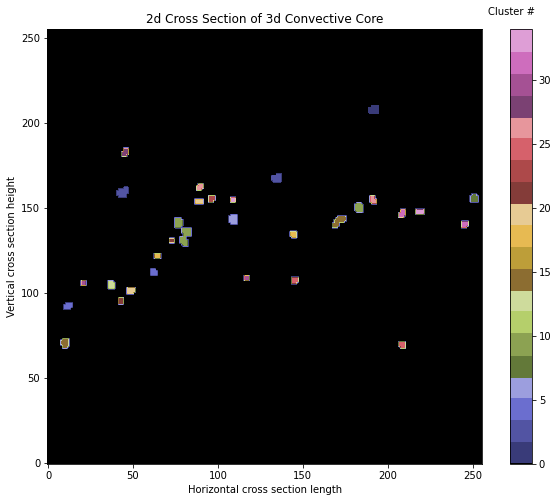

In [ ]:
#Adds labels to each graph
plt.figure(figsize=(10,8))
plt.title('2d Cross Section of 3d Convective Core')
plt.xlabel('Horizontal cross section length')
plt.ylabel('Vertical cross section height')


#Shows image
plt.imshow(labels_test_3d[18,:,:], cmap= newcmp)
# setting the lower and upper limits of the colorbar
clb=plt.colorbar(orientation='vertical')
clb.set_label('Cluster #', labelpad=-40, y=1.05, rotation=0)
plt.gca().invert_yaxis()

Time Step 3: 3d clustering and 2d cross section 

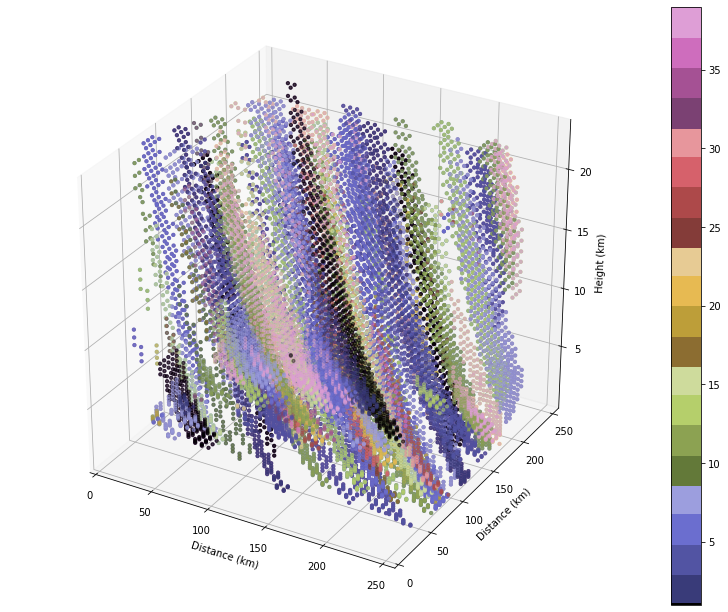

In [ ]:
#Segmenting array
b=cdf3_w[:,:,:]
b=np.where(b>10,1,0)

struct = np.zeros((3, 3, 3), dtype=int)
struct = np.array([[[True,True,True], [True,True,True], [True,True,True]], [[True,True,True], [True,True,True], [True,True,True]], [[True,True,True], [True,True,True], [True,True,True]]])
b = binary_dilation(b, structure=struct).astype(int)

#Labeling 
labels_test_3d, num_features_3d = label(b,struct)

#meshgrid for x-y-z 3D graph
x3d, y3d, z3d = np.meshgrid(cdf3_x, cdf3_y, cdf3_z) 
fig = plt.figure(figsize=(14,11))
ax = fig.add_subplot(111, projection='3d')

#Sets limits and lables for x,y,z axis
ax.set_xlim(cdf3_x[0],cdf3_x[-1])
ax.set_ylim(cdf3_y[0],cdf3_y[-1])
ax.set_zlim(cdf3_z[0],cdf3_z[-1])
ax.set_xlabel('Distance (km)')
ax.set_ylabel('Distance (km)')
ax.set_zlabel('Height (km)')

#Used for size paramter
alphaVals = np.copy(labels_test_3d)
#Sets each value in array
alphaVals[alphaVals==0]=0
alphaVals[alphaVals>0]=10

ax.scatter(x3d, y3d, z3d, c= labels_test_3d, s=alphaVals)

p = ax.scatter(x3d, y3d, z3d, c = labels_test_3d, s=alphaVals, vmin=1, vmax=39, cmap=newcmp)
fig.colorbar(p)

fig.show()

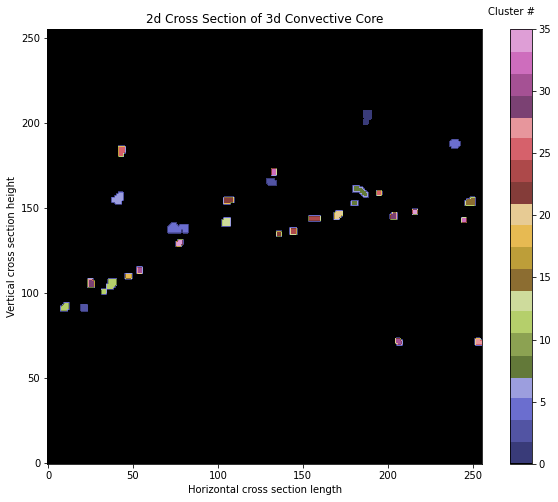

In [ ]:
#Adds labels to each graph
plt.figure(figsize=(10,8))
plt.title('2d Cross Section of 3d Convective Core')
plt.xlabel('Horizontal cross section length')
plt.ylabel('Vertical cross section height')


#Shows image
plt.imshow(labels_test_3d[18,:,:], cmap= newcmp)
# setting the lower and upper limits of the colorbar
clb=plt.colorbar(orientation='vertical')
clb.set_label('Cluster #', labelpad=-40, y=1.05, rotation=0)
plt.gca().invert_yaxis()

Time Step 4: 3d clustering and 2d cross section 

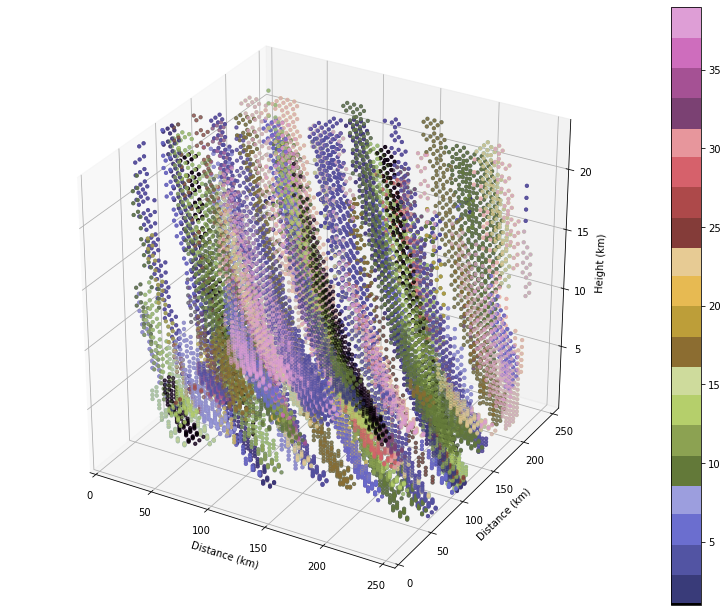

In [ ]:
#Segmenting array
b=cdf4_w[:,:,:]
b=np.where(b>10,1,0)

struct = np.zeros((3, 3, 3), dtype=int)
struct = np.array([[[True,True,True], [True,True,True], [True,True,True]], [[True,True,True], [True,True,True], [True,True,True]], [[True,True,True], [True,True,True], [True,True,True]]])
b = binary_dilation(b, structure=struct).astype(int)

#Labeling 
labels_test_3d, num_features_3d = label(b,struct)

#meshgrid for x-y-z 3D graph
x3d, y3d, z3d = np.meshgrid(cdf4_x, cdf4_y, cdf4_z) 
fig = plt.figure(figsize=(14,11))
ax = fig.add_subplot(111, projection='3d')

#Sets limits and lables for x,y,z axis
ax.set_xlim(cdf4_x[0],cdf4_x[-1])
ax.set_ylim(cdf4_y[0],cdf4_y[-1])
ax.set_zlim(cdf4_z[0],cdf4_z[-1])
ax.set_xlabel('Distance (km)')
ax.set_ylabel('Distance (km)')
ax.set_zlabel('Height (km)')

#Used for size paramter
alphaVals = np.copy(labels_test_3d)
#Sets each value in array
alphaVals[alphaVals==0]=0
alphaVals[alphaVals>0]=10

ax.scatter(x3d, y3d, z3d, c= labels_test_3d, s=alphaVals)

p = ax.scatter(x3d, y3d, z3d, c = labels_test_3d, s=alphaVals, vmin=1, vmax=39, cmap=newcmp)
fig.colorbar(p)

fig.show()

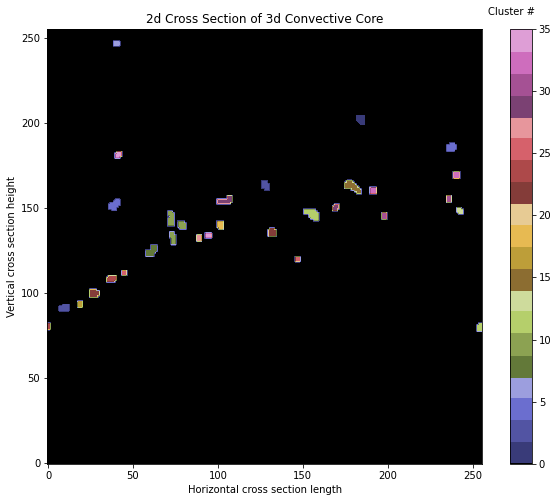

In [ ]:
#Adds labels to each graph
plt.figure(figsize=(10,8))
plt.title('2d Cross Section of 3d Convective Core')
plt.xlabel('Horizontal cross section length')
plt.ylabel('Vertical cross section height')


#Shows image
plt.imshow(labels_test_3d[18,:,:], cmap= newcmp)
# setting the lower and upper limits of the colorbar
clb=plt.colorbar(orientation='vertical')
clb.set_label('Cluster #', labelpad=-40, y=1.05, rotation=0)
plt.gca().invert_yaxis()

Time Step 5: 3d clustering and 2d cross section 

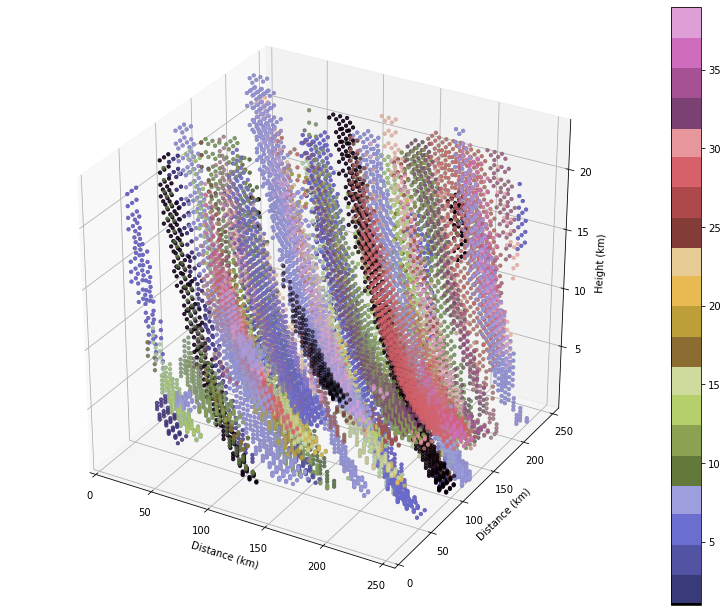

In [ ]:
#Segmenting array
b=cdf5_w[:,:,:]
b=np.where(b>10,1,0)

struct = np.zeros((3, 3, 3), dtype=int)
struct = np.array([[[True,True,True], [True,True,True], [True,True,True]], [[True,True,True], [True,True,True], [True,True,True]], [[True,True,True], [True,True,True], [True,True,True]]])
b = binary_dilation(b, structure=struct).astype(int)

#Labeling 
labels_test_3d, num_features_3d = label(b,struct)

#meshgrid for x-y-z 3D graph
x3d, y3d, z3d = np.meshgrid(cdf5_x, cdf5_y, cdf5_z) 
fig = plt.figure(figsize=(14,11))
ax = fig.add_subplot(111, projection='3d')

#Sets limits and lables for x,y,z axis
ax.set_xlim(cdf5_x[0],cdf5_x[-1])
ax.set_ylim(cdf5_y[0],cdf5_y[-1])
ax.set_zlim(cdf5_z[0],cdf5_z[-1])
ax.set_xlabel('Distance (km)')
ax.set_ylabel('Distance (km)')
ax.set_zlabel('Height (km)')

#Used for size paramter
alphaVals = np.copy(labels_test_3d)
#Sets each value in array
alphaVals[alphaVals==0]=0
alphaVals[alphaVals>0]=10

ax.scatter(x3d, y3d, z3d, c= labels_test_3d, s=alphaVals)

p = ax.scatter(x3d, y3d, z3d, c = labels_test_3d, s=alphaVals, vmin=1, vmax=39, cmap=newcmp)
fig.colorbar(p)

fig.show()

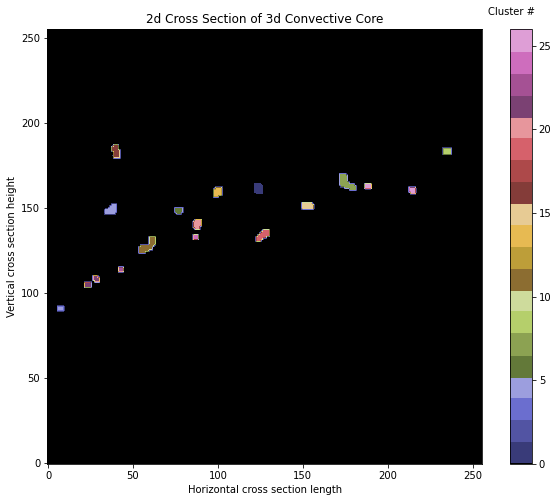

In [ ]:
#Adds labels to each graph
plt.figure(figsize=(10,8))
plt.title('2d Cross Section of 3d Convective Core')
plt.xlabel('Horizontal cross section length')
plt.ylabel('Vertical cross section height')


#Shows image
plt.imshow(labels_test_3d[18,:,:], cmap= newcmp)
# setting the lower and upper limits of the colorbar
clb=plt.colorbar(orientation='vertical')
clb.set_label('Cluster #', labelpad=-40, y=1.05, rotation=0)
plt.gca().invert_yaxis()

Time Step 6: 3d clustering and 2d cross section 

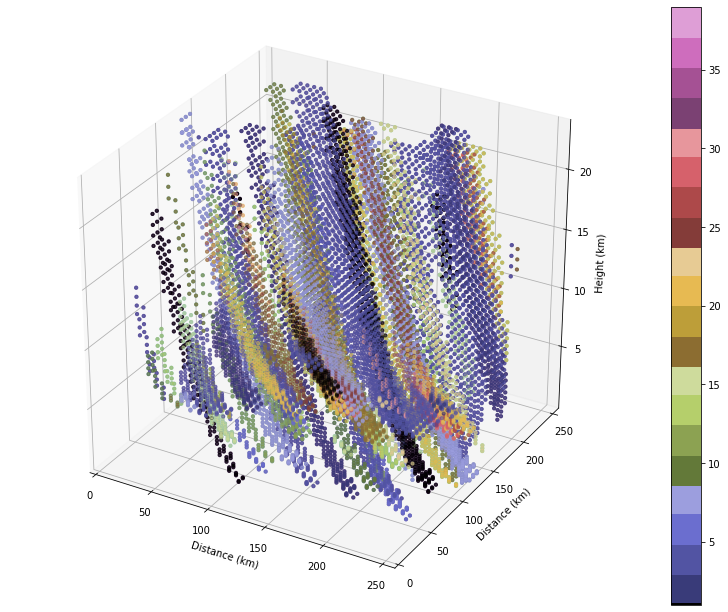

In [ ]:
#Segmenting array
b=cdf6_w[:,:,:]
b=np.where(b>10,1,0)

struct = np.zeros((3, 3, 3), dtype=int)
struct = np.array([[[True,True,True], [True,True,True], [True,True,True]], [[True,True,True], [True,True,True], [True,True,True]], [[True,True,True], [True,True,True], [True,True,True]]])
b = binary_dilation(b, structure=struct).astype(int)

#Labeling 
labels_test_3d, num_features_3d = label(b,struct)

#meshgrid for x-y-z 3D graph
x3d, y3d, z3d = np.meshgrid(cdf6_x, cdf6_y, cdf6_z) 
fig = plt.figure(figsize=(14,11))
ax = fig.add_subplot(111, projection='3d')

#Sets limits and lables for x,y,z axis
ax.set_xlim(cdf6_x[0],cdf6_x[-1])
ax.set_ylim(cdf6_y[0],cdf6_y[-1])
ax.set_zlim(cdf6_z[0],cdf6_z[-1])
ax.set_xlabel('Distance (km)')
ax.set_ylabel('Distance (km)')
ax.set_zlabel('Height (km)')

#Used for size paramter
alphaVals = np.copy(labels_test_3d)
#Sets each value in array
alphaVals[alphaVals==0]=0
alphaVals[alphaVals>0]=10

ax.scatter(x3d, y3d, z3d, c= labels_test_3d, s=alphaVals)

p = ax.scatter(x3d, y3d, z3d, c = labels_test_3d, s=alphaVals, vmin=1, vmax=39, cmap=newcmp)
fig.colorbar(p)

fig.show()

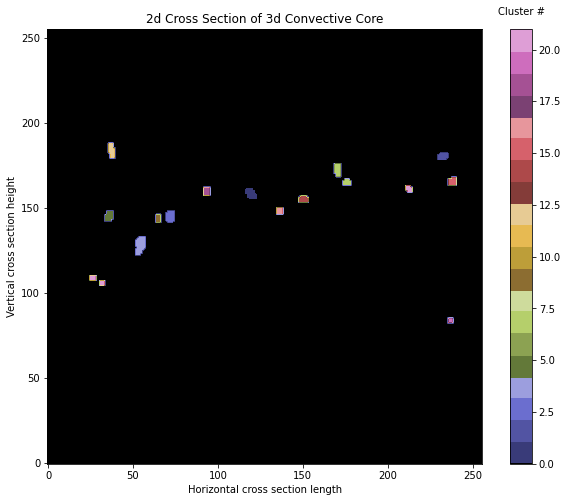

In [ ]:
#Adds labels to each graph
plt.figure(figsize=(10,8))
plt.title('2d Cross Section of 3d Convective Core')
plt.xlabel('Horizontal cross section length')
plt.ylabel('Vertical cross section height')


#Shows image
plt.imshow(labels_test_3d[18,:,:], cmap= newcmp)
# setting the lower and upper limits of the colorbar
clb=plt.colorbar(orientation='vertical')
clb.set_label('Cluster #', labelpad=-40, y=1.05, rotation=0)
plt.gca().invert_yaxis()

Time Step 7: 3d clustering and 2d cross section 

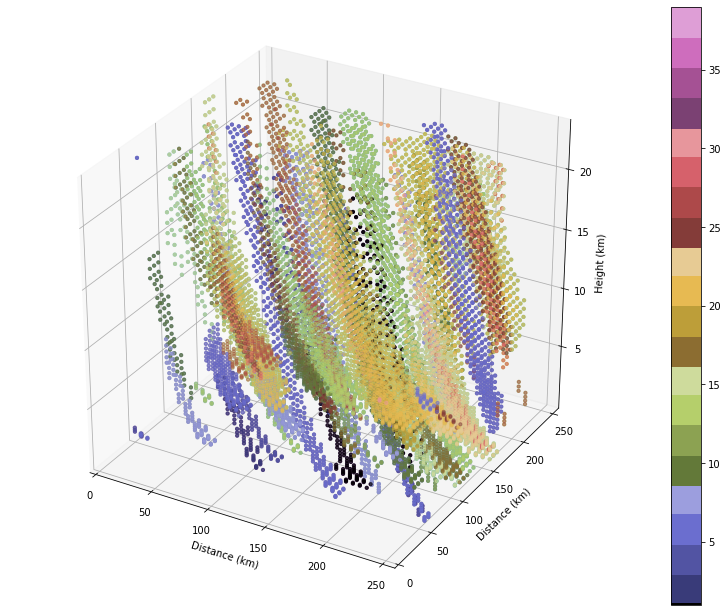

In [ ]:
#Segmenting array
b=cdf7_w[:,:,:]
b=np.where(b>10,1,0)

struct = np.zeros((3, 3, 3), dtype=int)
struct = np.array([[[True,True,True], [True,True,True], [True,True,True]], [[True,True,True], [True,True,True], [True,True,True]], [[True,True,True], [True,True,True], [True,True,True]]])
b = binary_dilation(b, structure=struct).astype(int)

#Labeling 
labels_test_3d, num_features_3d = label(b,struct)

#Creates custom colormap to display value 0 as black
viridis = cm.get_cmap('tab20b', 256)
newcolors = viridis(np.linspace(0, 1, 256))
black = np.array([0/256, 0/256, 0/256, 1])
newcolors[:1, :] = black
newcmp = ListedColormap(newcolors)

#meshgrid for x-y-z 3D graph
x3d, y3d, z3d = np.meshgrid(cdf7_x, cdf7_y, cdf7_z) 
fig = plt.figure(figsize=(14,11))
ax = fig.add_subplot(111, projection='3d')

#Sets limits and lables for x,y,z axis
ax.set_xlim(cdf7_x[0],cdf7_x[-1])
ax.set_ylim(cdf7_y[0],cdf7_y[-1])
ax.set_zlim(cdf7_z[0],cdf7_z[-1])
ax.set_xlabel('Distance (km)')
ax.set_ylabel('Distance (km)')
ax.set_zlabel('Height (km)')

#Used for size paramter
alphaVals = np.copy(labels_test_3d)
#Sets each value in array
alphaVals[alphaVals==0]=0
alphaVals[alphaVals>0]=10

ax.scatter(x3d, y3d, z3d, c= labels_test_3d, s=alphaVals)

p = ax.scatter(x3d, y3d, z3d, c = labels_test_3d, s=alphaVals, vmin=1, vmax=39, cmap=newcmp)
fig.colorbar(p)

fig.show()

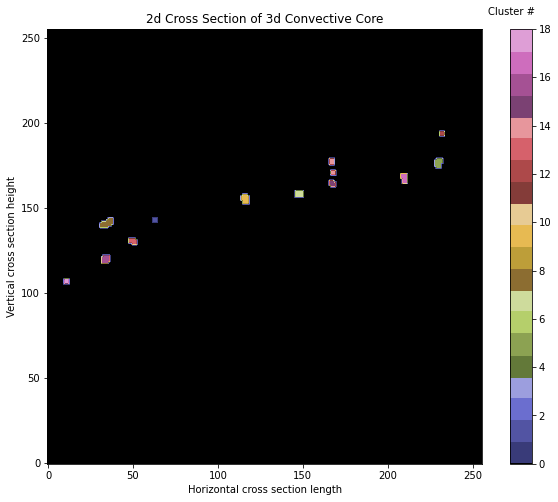

In [ ]:
#Adds labels to each graph
plt.figure(figsize=(10,8))
plt.title('2d Cross Section of 3d Convective Core')
plt.xlabel('Horizontal cross section length')
plt.ylabel('Vertical cross section height')


#Shows image
plt.imshow(labels_test_3d[18,:,:], cmap= newcmp)
# setting the lower and upper limits of the colorbar
clb=plt.colorbar(orientation='vertical')
clb.set_label('Cluster #', labelpad=-40, y=1.05, rotation=0)
plt.gca().invert_yaxis()

Time Step 8: 3d clustering and 2d cross section 

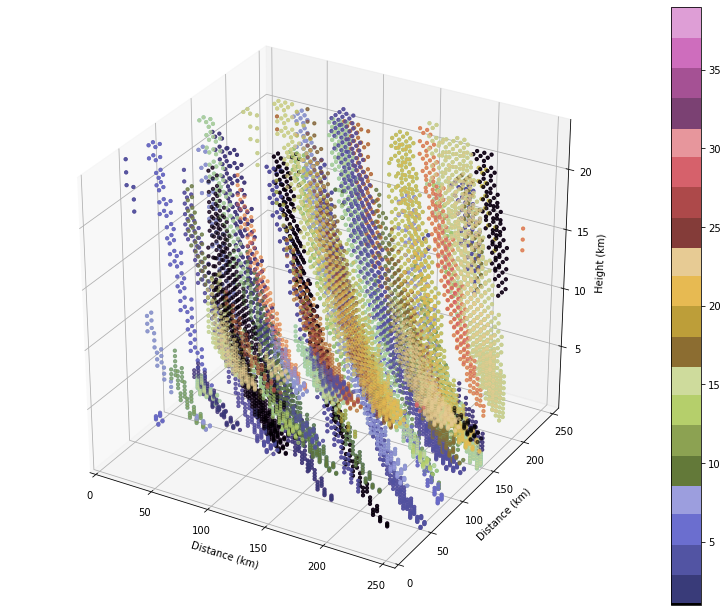

In [ ]:
#Segmenting array
b=cdf8_w[:,:,:]
b=np.where(b>10,1,0)

struct = np.zeros((3, 3, 3), dtype=int)
struct = np.array([[[True,True,True], [True,True,True], [True,True,True]], [[True,True,True], [True,True,True], [True,True,True]], [[True,True,True], [True,True,True], [True,True,True]]])
b = binary_dilation(b, structure=struct).astype(int)

#Labeling 
labels_test_3d, num_features_3d = label(b,struct)

#meshgrid for x-y-z 3D graph
x3d, y3d, z3d = np.meshgrid(cdf8_x, cdf8_y, cdf8_z) 
fig = plt.figure(figsize=(14,11))
ax = fig.add_subplot(111, projection='3d')

#Sets limits and lables for x,y,z axis
ax.set_xlim(cdf8_x[0],cdf8_x[-1])
ax.set_ylim(cdf8_y[0],cdf8_y[-1])
ax.set_zlim(cdf8_z[0],cdf8_z[-1])
ax.set_xlabel('Distance (km)')
ax.set_ylabel('Distance (km)')
ax.set_zlabel('Height (km)')

#Used for size paramter
alphaVals = np.copy(labels_test_3d)
#Sets each value in array
alphaVals[alphaVals==0]=0
alphaVals[alphaVals>0]=10

ax.scatter(x3d, y3d, z3d, c= labels_test_3d, s=alphaVals)

p = ax.scatter(x3d, y3d, z3d, c = labels_test_3d, s=alphaVals, vmin=1, vmax=39, cmap=newcmp)
fig.colorbar(p)

fig.show()

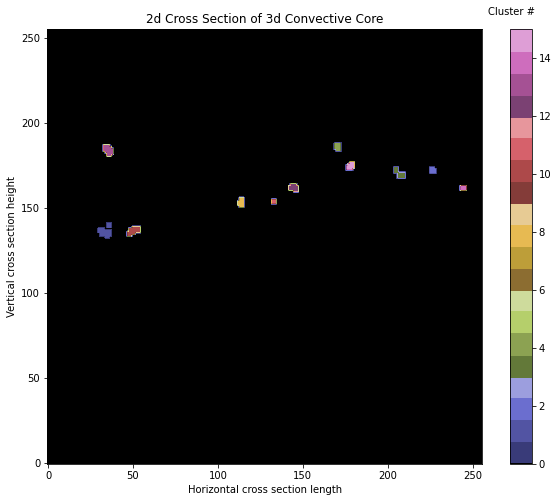

In [ ]:
#Adds labels to each graph
plt.figure(figsize=(10,8))
plt.title('2d Cross Section of 3d Convective Core')
plt.xlabel('Horizontal cross section length')
plt.ylabel('Vertical cross section height')


#Shows image
plt.imshow(labels_test_3d[18,:,:], cmap= newcmp)
# setting the lower and upper limits of the colorbar
clb=plt.colorbar(orientation='vertical')
clb.set_label('Cluster #', labelpad=-40, y=1.05, rotation=0)
plt.gca().invert_yaxis()

Time Step 9: 3d clustering and 2d cross section 

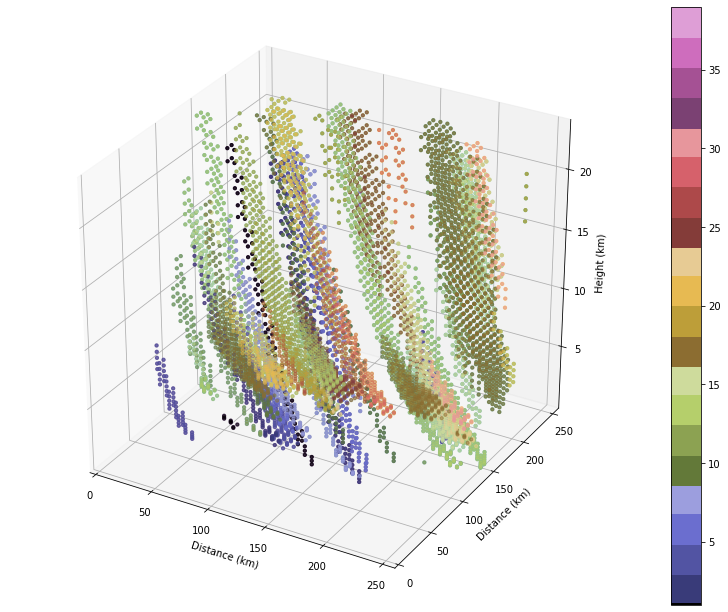

In [ ]:
#Segmenting array
b=cdf9_w[:,:,:]
b=np.where(b>10,1,0)

struct = np.zeros((3, 3, 3), dtype=int)
struct = np.array([[[True,True,True], [True,True,True], [True,True,True]], [[True,True,True], [True,True,True], [True,True,True]], [[True,True,True], [True,True,True], [True,True,True]]])
b = binary_dilation(b, structure=struct).astype(int)

#Labeling 
labels_test_3d, num_features_3d = label(b,struct)

#meshgrid for x-y-z 3D graph
x3d, y3d, z3d = np.meshgrid(cdf9_x, cdf9_y, cdf9_z) 
fig = plt.figure(figsize=(14,11))
ax = fig.add_subplot(111, projection='3d')

#Sets limits and lables for x,y,z axis
ax.set_xlim(cdf9_x[0],cdf9_x[-1])
ax.set_ylim(cdf9_y[0],cdf9_y[-1])
ax.set_zlim(cdf9_z[0],cdf9_z[-1])
ax.set_xlabel('Distance (km)')
ax.set_ylabel('Distance (km)')
ax.set_zlabel('Height (km)')

#Used for size paramter
alphaVals = np.copy(labels_test_3d)
#Sets each value in array
alphaVals[alphaVals==0]=0
alphaVals[alphaVals>0]=10

ax.scatter(x3d, y3d, z3d, c= labels_test_3d, s=alphaVals)

p = ax.scatter(x3d, y3d, z3d, c = labels_test_3d, s=alphaVals, vmin=1, vmax=39, cmap=newcmp)
fig.colorbar(p)

fig.show()

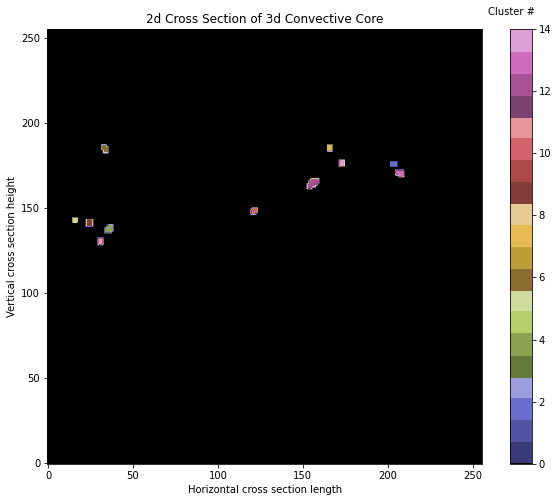

In [ ]:
#Adds labels to each graph
plt.figure(figsize=(10,8))
plt.title('2d Cross Section of 3d Convective Core')
plt.xlabel('Horizontal cross section length')
plt.ylabel('Vertical cross section height')


#Shows image
plt.imshow(labels_test_3d[18,:,:], cmap= newcmp)
# setting the lower and upper limits of the colorbar
clb=plt.colorbar(orientation='vertical')
clb.set_label('Cluster #', labelpad=-40, y=1.05, rotation=0)
plt.gca().invert_yaxis()

Time Step 10: 3d clustering and 2d cross section 

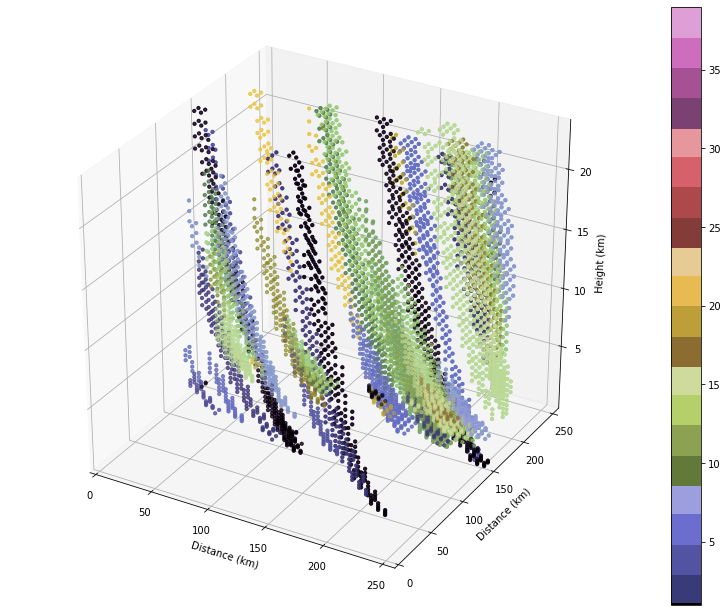

In [ ]:
#Segmenting array
b=cdf10_w[:,:,:]
b=np.where(b>10,1,0)

struct = np.zeros((3, 3, 3), dtype=int)
struct = np.array([[[True,True,True], [True,True,True], [True,True,True]], [[True,True,True], [True,True,True], [True,True,True]], [[True,True,True], [True,True,True], [True,True,True]]])
b = binary_dilation(b, structure=struct).astype(int)

#Labeling 
labels_test_3d, num_features_3d = label(b,struct)

#meshgrid for x-y-z 3D graph
x3d, y3d, z3d = np.meshgrid(cdf10_x, cdf10_y, cdf10_z) 
fig = plt.figure(figsize=(14,11))
ax = fig.add_subplot(111, projection='3d')

#Sets limits and lables for x,y,z axis
ax.set_xlim(cdf10_x[0],cdf10_x[-1])
ax.set_ylim(cdf10_y[0],cdf10_y[-1])
ax.set_zlim(cdf10_z[0],cdf10_z[-1])
ax.set_xlabel('Distance (km)')
ax.set_ylabel('Distance (km)')
ax.set_zlabel('Height (km)')

#Used for size paramter
alphaVals = np.copy(labels_test_3d)
#Sets each value in array
alphaVals[alphaVals==0]=0
alphaVals[alphaVals>0]=10

ax.scatter(x3d, y3d, z3d, c= labels_test_3d, s=alphaVals)

p = ax.scatter(x3d, y3d, z3d, c = labels_test_3d, s=alphaVals, vmin=1, vmax=39, cmap=newcmp)
fig.colorbar(p)

fig.show()

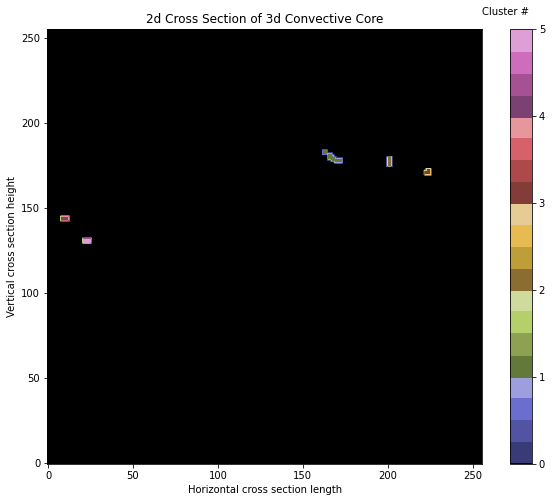

In [ ]:
#Adds labels to each graph
plt.figure(figsize=(10,8))
plt.title('2d Cross Section of 3d Convective Core')
plt.xlabel('Horizontal cross section length')
plt.ylabel('Vertical cross section height')


#Shows image
plt.imshow(labels_test_3d[18,:,:], cmap= newcmp)
# setting the lower and upper limits of the colorbar
clb=plt.colorbar(orientation='vertical')
clb.set_label('Cluster #', labelpad=-40, y=1.05, rotation=0)
plt.gca().invert_yaxis()

Time Step 11: 3d clustering and 2d cross section 

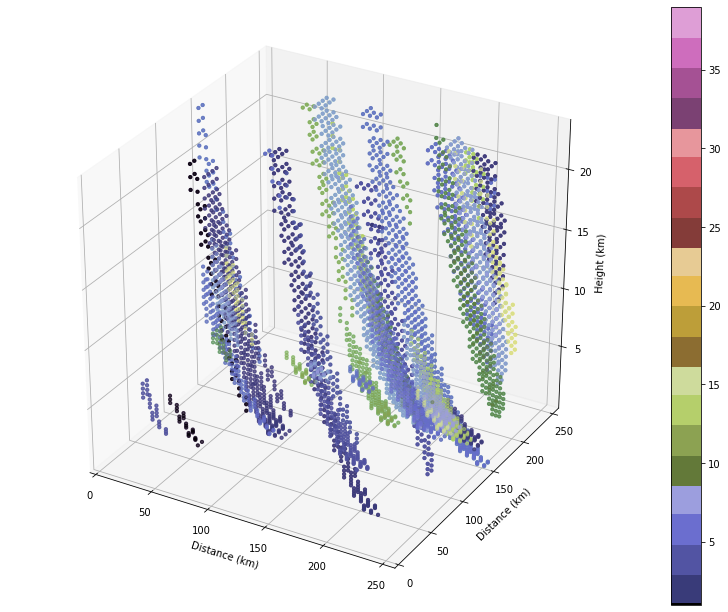

In [ ]:
#Segmenting array
b=cdf11_w[:,:,:]
b=np.where(b>10,1,0)

struct = np.zeros((3, 3, 3), dtype=int)
struct = np.array([[[True,True,True], [True,True,True], [True,True,True]], [[True,True,True], [True,True,True], [True,True,True]], [[True,True,True], [True,True,True], [True,True,True]]])
b = binary_dilation(b, structure=struct).astype(int)

#Labeling 
labels_test_3d, num_features_3d = label(b,struct)

#meshgrid for x-y-z 3D graph
x3d, y3d, z3d = np.meshgrid(cdf11_x, cdf11_y, cdf11_z) 
fig = plt.figure(figsize=(14,11))
ax = fig.add_subplot(111, projection='3d')

#Sets limits and lables for x,y,z axis
ax.set_xlim(cdf11_x[0],cdf11_x[-1])
ax.set_ylim(cdf11_y[0],cdf11_y[-1])
ax.set_zlim(cdf11_z[0],cdf11_z[-1])
ax.set_xlabel('Distance (km)')
ax.set_ylabel('Distance (km)')
ax.set_zlabel('Height (km)')

#Used for size paramter
alphaVals = np.copy(labels_test_3d)
#Sets each value in array
alphaVals[alphaVals==0]=0
alphaVals[alphaVals>0]=10

ax.scatter(x3d, y3d, z3d, c= labels_test_3d, s=alphaVals)

p = ax.scatter(x3d, y3d, z3d, c = labels_test_3d, s=alphaVals, vmin=1, vmax=39, cmap=newcmp)
fig.colorbar(p)

fig.show()

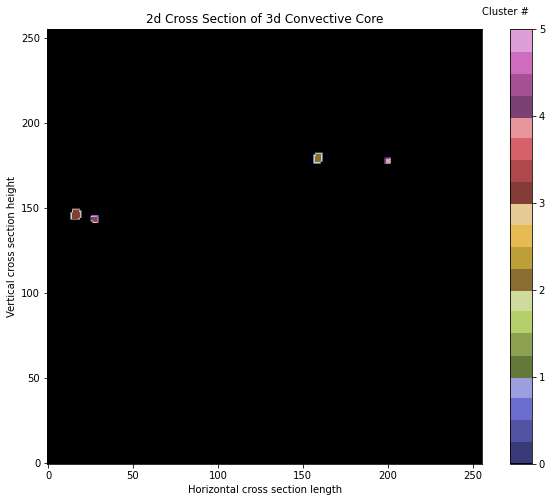

In [ ]:
#Adds labels to each graph
plt.figure(figsize=(10,8))
plt.title('2d Cross Section of 3d Convective Core')
plt.xlabel('Horizontal cross section length')
plt.ylabel('Vertical cross section height')


#Shows image
plt.imshow(labels_test_3d[18,:,:], cmap= newcmp)
# setting the lower and upper limits of the colorbar
clb=plt.colorbar(orientation='vertical')
clb.set_label('Cluster #', labelpad=-40, y=1.05, rotation=0)
plt.gca().invert_yaxis()

Time Step 12: 3d clustering and 2d cross section 

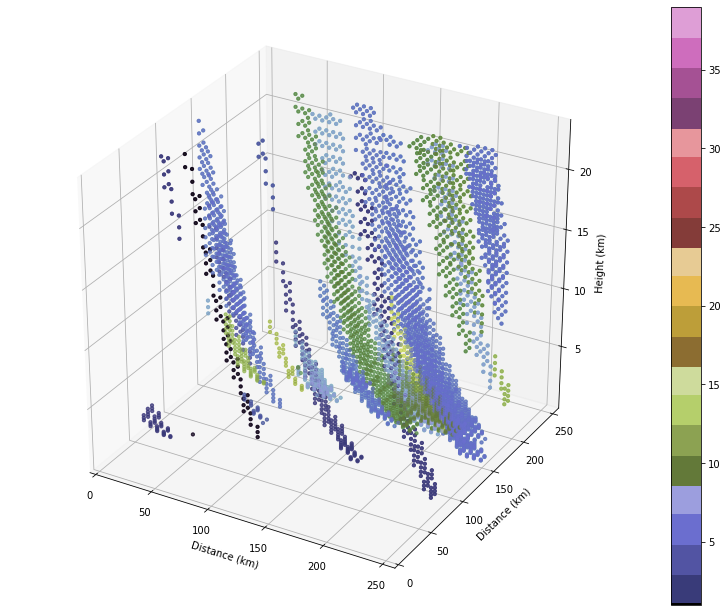

In [ ]:
#Segmenting array
b=cdf12_w[:,:,:]
b=np.where(b>10,1,0)

struct = np.zeros((3, 3, 3), dtype=int)
struct = np.array([[[True,True,True], [True,True,True], [True,True,True]], [[True,True,True], [True,True,True], [True,True,True]], [[True,True,True], [True,True,True], [True,True,True]]])
b = binary_dilation(b, structure=struct).astype(int)

#Labeling 
labels_test_3d, num_features_3d = label(b,struct)

#meshgrid for x-y-z 3D graph
x3d, y3d, z3d = np.meshgrid(cdf12_x, cdf12_y, cdf12_z) 
fig = plt.figure(figsize=(14,11))
ax = fig.add_subplot(111, projection='3d')

#Sets limits and lables for x,y,z axis
ax.set_xlim(cdf12_x[0],cdf12_x[-1])
ax.set_ylim(cdf12_y[0],cdf12_y[-1])
ax.set_zlim(cdf12_z[0],cdf12_z[-1])
ax.set_xlabel('Distance (km)')
ax.set_ylabel('Distance (km)')
ax.set_zlabel('Height (km)')

#Used for size paramter
alphaVals = np.copy(labels_test_3d)
#Sets each value in array
alphaVals[alphaVals==0]=0
alphaVals[alphaVals>0]=10

ax.scatter(x3d, y3d, z3d, c= labels_test_3d, s=alphaVals)

p = ax.scatter(x3d, y3d, z3d, c = labels_test_3d, s=alphaVals, vmin=1, vmax=39, cmap=newcmp)
fig.colorbar(p)

fig.show()

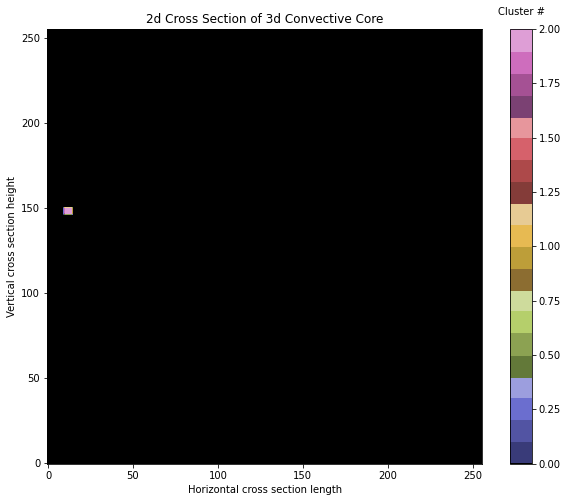

In [ ]:
#Adds labels to each graph
plt.figure(figsize=(10,8))
plt.title('2d Cross Section of 3d Convective Core')
plt.xlabel('Horizontal cross section length')
plt.ylabel('Vertical cross section height')


#Shows image
plt.imshow(labels_test_3d[18,:,:], cmap= newcmp)
# setting the lower and upper limits of the colorbar
clb=plt.colorbar(orientation='vertical')
clb.set_label('Cluster #', labelpad=-40, y=1.05, rotation=0)
plt.gca().invert_yaxis()

#Conclusions
We finished the project by identifing 12 data clusters that help us determine which wind speed pixels belong to different cores. However, we are not able to see which specfic data ia a part of each core. In the future, we would like to create a grid showing exactly where the data from all 12 clusters came from. Another obstacle in the project we were unable to overcome was implementing k-means or guassian clustering. This would allow us to compare the effectiveness of each method and to determine which is more effective. Future projects our team would like to pursue with this data set and/or python methods include allowing users to interact with our 3d clustering models (allow for better visualization of plotting), implementing k-means and/or guassian mixture modeling clustering in order to determine which clustering method is the most effective, and to begin creating an algorithm to predict movement of convective cores.

#Bibliography

Giangrande, Scott E., et al. “A Summary of Convective-Core Vertical Velocity Properties Using ARM UHF Wind Profilers in Oklahoma.” AMETSOC, American Meteorological Society, 1 Oct. 2013, journals.ametsoc.org/jamc/article/52/10/2278/13772/A-Summary-of-Convective-Core-Vertical-Velocity. 

II, David John Gagne, et al. “Storm-Based Probabilistic Hail Forecasting with Machine Learning Applied to Convection-Allowing Ensembles.” AMETSOC, American Meteorological Society, 1 Oct. 2017, journals.ametsoc.org/waf/article/32/5/1819/41181. 

Jergensen, G. Eli, Amy McGovern, Ryan Lagerquist, and Travis Smith. " Classifying Convective Storms Using Machine Learning". Weather and Forecasting 35.2 (2020): 537-559. https://doi.org/10.1175/WAF-D-19-0170.1. Web. 7 Dec. 2020.

Kiani, Sohaib. “sohaib730/Gaussian-Mixture-Model.” GitHub, 18 Feb. 2019, github.com/sohaib730/Gaussian-Mixture-Model. 

Stubenrauch, C. J., Caria, G., Protopapadaki, S. E., and Hemmer, F.: 3D Radiative Heating of Tropical Upper Tropospheric Cloud Systems derived from Synergistic A-Train Observations and Machine Learning, Atmos. Chem. Phys. Discuss., https://doi.org/10.5194/acp-2020-613, in review, 2020.